In [2]:
import networkx as nx

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from networkx.algorithms import community


c:\Users\Dell 5520\Anaconda3\lib\site-packages\pandas\compat\_optional.py:138: UserWarning: Pandas requires version '2.7.0' or newer of 'numexpr' (version '2.6.9' currently installed).
  warnings.warn(msg, UserWarning)


In [3]:
df_original = pd.read_csv('data/primaryschool.csv', header=None, delimiter='\t', names = ['time', 'u', 'v', 'grade_u', 'grade_v'])
print(df_original.head())

metadata = pd.read_csv('data/metadata.txt', header=None, delimiter='\t', names = ['id', 'grade', 'gender'])
print(metadata.head())

    time     u     v grade_u grade_v
0  31220  1558  1567      3B      3B
1  31220  1560  1570      3B      3B
2  31220  1567  1574      3B      3B
3  31220  1632  1818      4B      4B
4  31220  1632  1866      4B      4B
     id grade gender
0  1426    5B      M
1  1427    5B      F
2  1428    5B      M
3  1429    5B      F
4  1430    5B      M


In [4]:
# Sort dataframe by source, target, and timestamp
df_original = df_original.sort_values(by=['u', 'v', 'time'])

# Initialize an empty list to store the results
df = []

# Iterate through the dataframe to calculate weights
for (u, v), group in df_original.groupby(['u', 'v']):
    timestamps = group['time'].tolist()
    weight = 1
    first_time = timestamps[0]
    for i in range(1, len(timestamps)):
        if timestamps[i] == timestamps[i-1] + 20:
            weight += 1
        else:
            df.append({'u': u, 'v': v, 'weight': weight, 'time': first_time})
            weight = 1
            first_time = timestamps[i]
    df.append({'u': u, 'v': v, 'weight': weight, 'time': first_time})

# Create a new dataframe from the result
df = pd.DataFrame(df)

print(df.head(10))

      u     v  weight   time
0  1426  1427       1  36740
1  1426  1427       2  36940
2  1426  1427       2  39640
3  1426  1427       2  52820
4  1426  1427       1  54760
5  1426  1427       2  56580
6  1426  1427       1  60680
7  1426  1427       2  61080
8  1426  1427       1  61160
9  1426  1427       2  61320


In [5]:
grade_dict = {"1A": "red", "1B": "red", "2A": "orange", "2B": "orange", "3A": "gray", "3B": "gray", "4A": "cyan", "4B": "cyan", "5A": "blue", "5B": "blue", "Teachers": "black"}
grade_dict_more = {"1A": "firebrick", "1B": "red", "2A": "orange", "2B": "sandybrown", "3A": "slategray", "3B": "gray", "4A": "darkturquoise", "4B": "cyan", "5A": "cornflowerblue", "5B": "blue", "Teachers": "black"}

node_grade = {}
for _, row in metadata.iterrows():
    node_grade[row['id']] = row['grade']

In [6]:
G = nx.Graph()
for _, row in metadata.iterrows():
    if row['grade'] != "Teachers":
        G.add_node(row['id'], color=grade_dict_more[row['grade']])

for _, edge in df.iterrows():
    if node_grade[edge['u']] != "Teachers" and node_grade[edge['v']] != "Teachers":
        G.add_edge(edge['u'], edge['v'], weight=edge['weight'], time=edge['time'])


In [7]:
group = {grade: metadata[metadata['grade'] == grade]['id'].tolist() for grade in metadata['grade'].unique()}
group = {'1A': group['1A'], '1B': group['1B'], '5A': group['5A'], '5B': group['5B']}

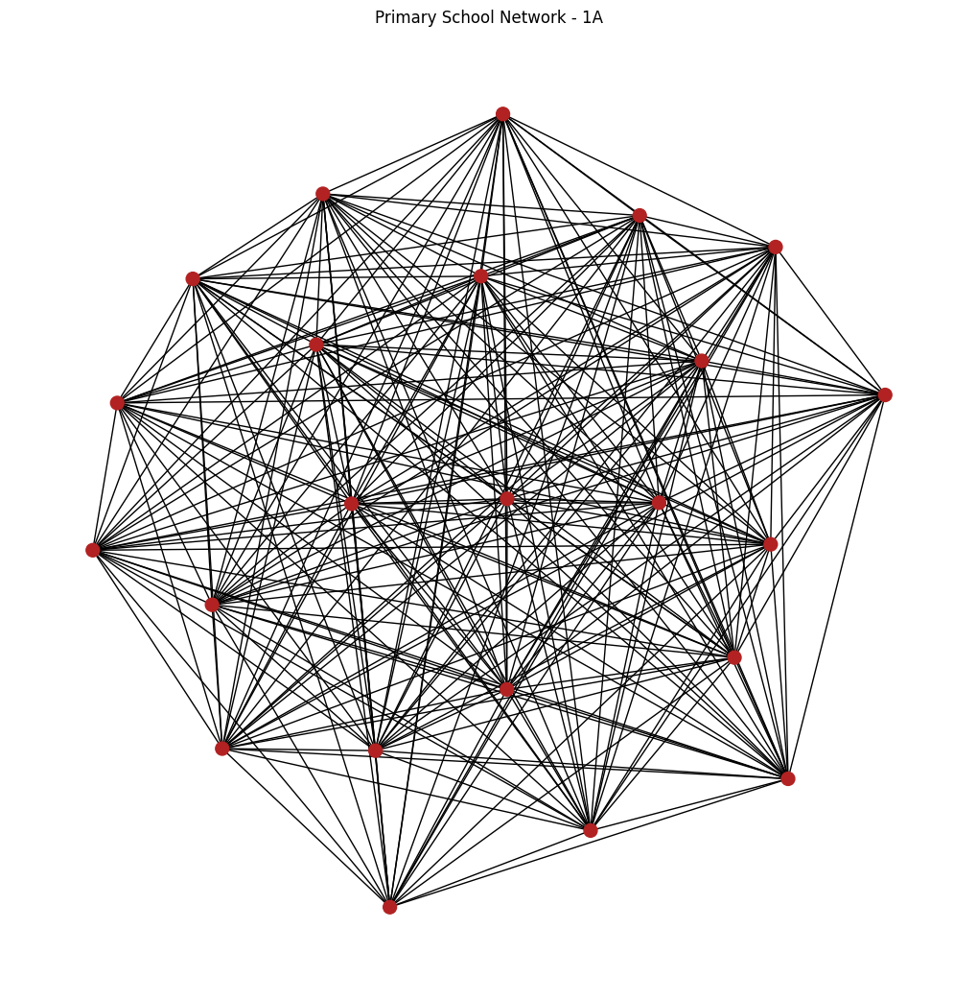

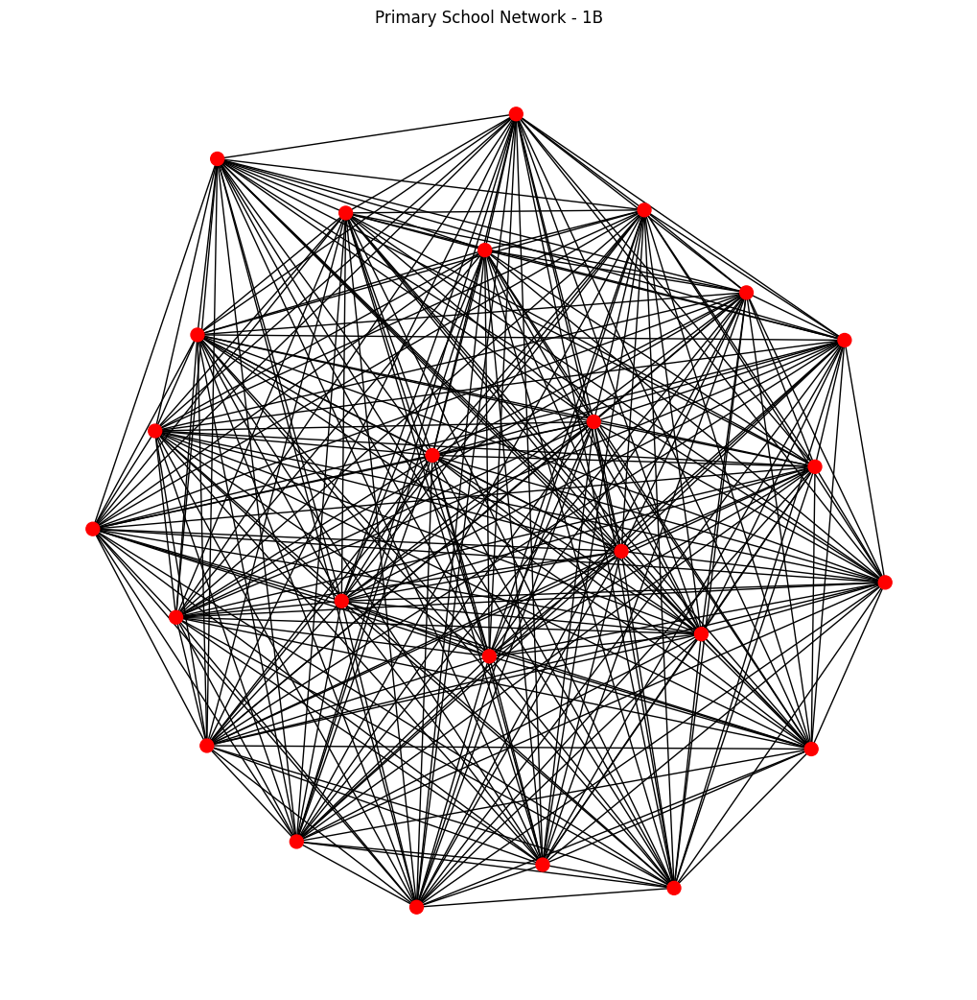

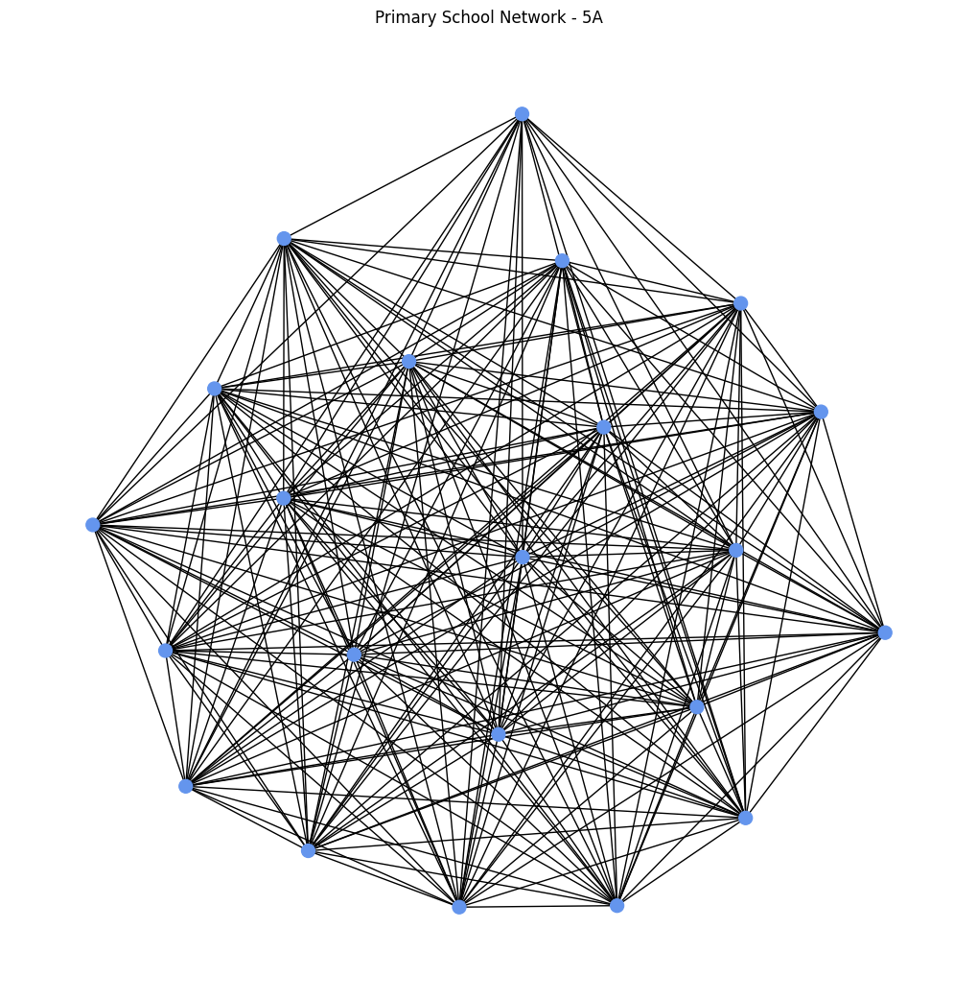

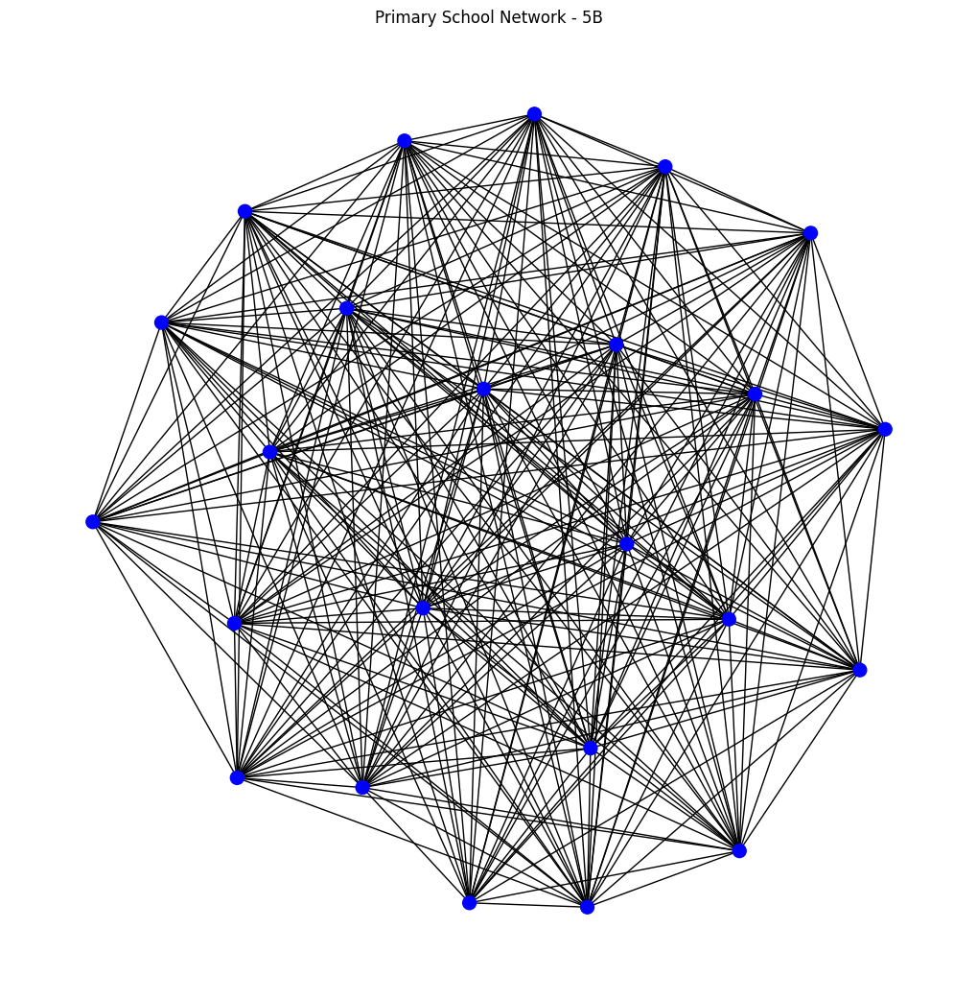

In [8]:
for grade, nodes in group.items():
    subgraph = G.subgraph(nodes)
    pos = nx.spring_layout(subgraph)
    plt.figure(figsize=(10, 10))
    nx.draw(subgraph, pos, node_color=[grade_dict_more[node_grade[node]] for node in subgraph.nodes()], with_labels=False, node_size=100)
    plt.title(f'Primary School Network - {grade}')
    plt.show()

In [9]:
for grade, nodes in group.items():
    subgraph = G.subgraph(nodes)
    print(f'Grade: {grade}, Number of nodes: {len(subgraph.nodes())}, Number of edges: {len(subgraph.edges())}')

Grade: 1A, Number of nodes: 23, Number of edges: 249
Grade: 1B, Number of nodes: 25, Number of edges: 299
Grade: 5A, Number of nodes: 22, Number of edges: 225
Grade: 5B, Number of nodes: 24, Number of edges: 270


In [10]:
for grade, nodes in group.items():
    df_group = df[df['u'].isin(nodes) & df['v'].isin(nodes)]
    subgraph = G.subgraph(nodes)

    avg_length = round(df_group["weight"].mean(), 2)
    avg_degree = round(np.mean(list(dict(subgraph.degree()).values())), 2)
    max_degree = round(np.max(list(dict(subgraph.degree()).values())), 2)
    min_degree = round(np.min(list(dict(subgraph.degree()).values())), 2)

    print(f'Grade: {grade}, Average length: {avg_length}. Av. degree: {avg_degree}. Max degree: {max_degree}. Min degree: {min_degree}.')


Grade: 1A, Average length: 1.49. Av. degree: 21.65. Max degree: 22. Min degree: 19.
Grade: 1B, Average length: 1.73. Av. degree: 23.92. Max degree: 24. Min degree: 23.
Grade: 5A, Average length: 1.63. Av. degree: 20.45. Max degree: 21. Min degree: 16.
Grade: 5B, Average length: 1.65. Av. degree: 22.5. Max degree: 23. Min degree: 19.


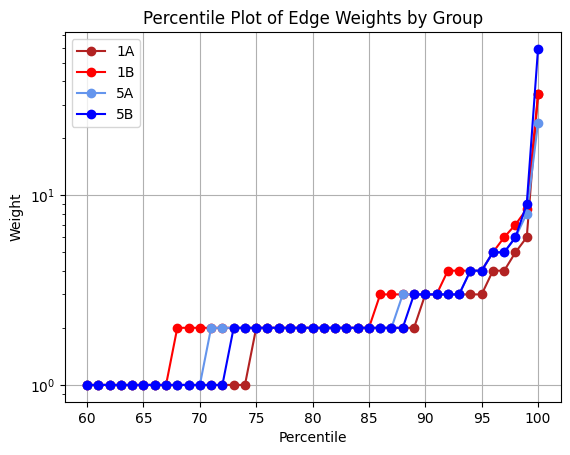

In [11]:
for grade, nodes in group.items():
    subgraph = G.subgraph(nodes)
    df_group = df[df['u'].isin(nodes) & df['v'].isin(nodes)]
    percentiles = np.percentile(df_group['weight'], np.arange(0, 101, 1))

    # Plot the percentiles
    plt.plot(np.arange(60, 101, 1), percentiles[60:], marker='o', label=grade, color=grade_dict_more[grade])

plt.xlabel('Percentile')
plt.ylabel('Weight')
plt.yscale('log')
plt.title('Percentile Plot of Edge Weights by Group')
plt.legend()
plt.grid(True)
plt.show()


Sub-Communities


In [12]:
import importlib
import community_visualization

# Reload the module
importlib.reload(community_visualization)

<module 'community_visualization' from 'c:\\Users\\Dell 5520\\Documents\\UCL_Networks\\community_visualization.py'>

In [13]:
import networkx as nx
import matplotlib.pyplot as plt
from community_visualization import assign_colors_to_communities, draw_graph_with_communities

In [14]:
def draw_graph_per_community(G, pos, node_colors, communities):
    fig, axes = plt.subplots(1, len(communities), figsize=(4*len(communities), 4))
    print(len(communities))
    if len(communities) == 1:
        axes = [axes]  # Ensure axes is iterable

    for ax, community in zip(axes, communities):
        subgraph = G.subgraph(community)
        nx.draw(subgraph, pos, ax=ax, node_color=[grade_dict_more[node_grade[node]]for node in community], with_labels=True, node_size=100, edge_color='gray')
        ax.set_title(f"Community {communities.index(community) + 1}")

    plt.show()

grade 1A. Number of communities: 22
Communities: [({1792, 1796, 1798, 1711, 1752, 1757, 1759, 1760, 1761, 1764, 1766, 1767, 1768, 1770, 1772, 1774, 1775, 1778, 1783, 1787, 1789, 1790}, {1799}), ({1792, 1796, 1798, 1711, 1752, 1757, 1759, 1760, 1761, 1764, 1766, 1768, 1770, 1772, 1774, 1775, 1778, 1783, 1787, 1789, 1790}, {1799}, {1767}), ({1792}, {1796, 1798, 1711, 1752, 1757, 1759, 1760, 1761, 1764, 1766, 1768, 1770, 1772, 1774, 1775, 1778, 1783, 1787, 1789, 1790}, {1799}, {1767}), ({1792}, {1796}, {1798, 1711, 1752, 1757, 1759, 1760, 1761, 1764, 1766, 1768, 1770, 1772, 1774, 1775, 1778, 1783, 1787, 1789, 1790}, {1799}, {1767}), ({1792}, {1796}, {1798}, {1799}, {1760, 1761, 1764, 1766, 1768, 1757, 1770, 1772, 1774, 1711, 1775, 1778, 1783, 1752, 1787, 1789, 1790, 1759}, {1767}), ({1792}, {1796}, {1798}, {1799}, {1711}, {1760, 1761, 1764, 1766, 1768, 1757, 1770, 1772, 1774, 1775, 1778, 1783, 1752, 1787, 1789, 1790, 1759}, {1767}), ({1792}, {1796}, {1798}, {1799}, {1711}, {1752}, {1760, 

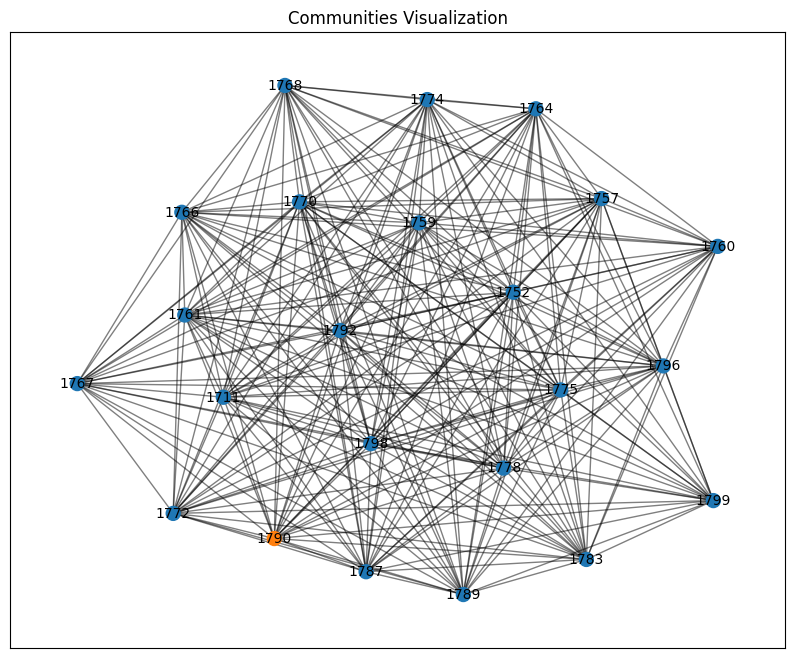

2


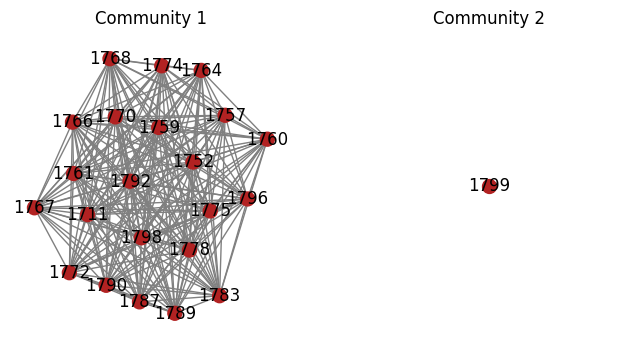

3


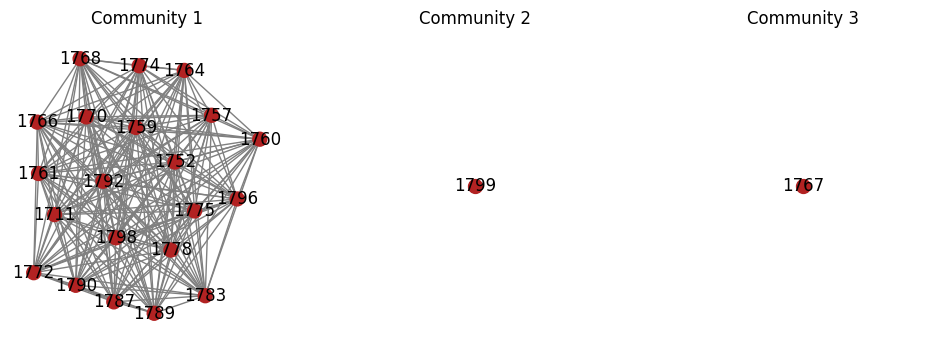

4


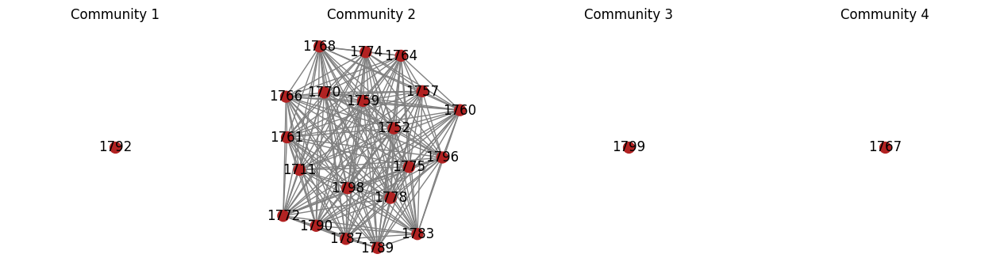

5


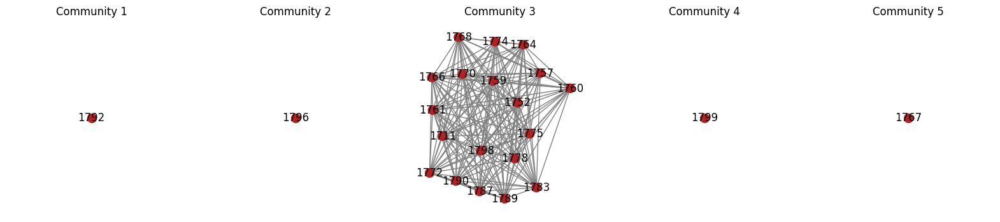

grade 1B. Number of communities: 24
Communities: [({1664, 1665, 1666, 1920, 1670, 1673, 1675, 1656, 1680, 1681, 1682, 1684, 1687, 1688, 1695, 1696, 1697, 1698, 1765, 1779, 1908, 1912, 1661, 1663}, {1674}), ({1664}, {1920, 1665, 1666, 1670, 1673, 1675, 1656, 1680, 1681, 1682, 1684, 1687, 1688, 1695, 1696, 1697, 1698, 1765, 1779, 1908, 1912, 1661, 1663}, {1674}), ({1664}, {1665}, {1920, 1666, 1670, 1673, 1675, 1656, 1680, 1681, 1682, 1684, 1687, 1688, 1695, 1696, 1697, 1698, 1765, 1779, 1908, 1912, 1661, 1663}, {1674}), ({1664}, {1665}, {1666}, {1920, 1670, 1673, 1675, 1680, 1681, 1682, 1684, 1912, 1687, 1688, 1695, 1696, 1697, 1698, 1765, 1779, 1908, 1656, 1661, 1663}, {1674}), ({1664}, {1665}, {1666}, {1920}, {1670, 1673, 1675, 1680, 1681, 1682, 1684, 1912, 1687, 1688, 1695, 1696, 1697, 1698, 1765, 1779, 1908, 1656, 1661, 1663}, {1674}), ({1664}, {1665}, {1666}, {1920}, {1670}, {1673, 1675, 1680, 1681, 1682, 1684, 1912, 1687, 1688, 1695, 1696, 1697, 1698, 1765, 1779, 1908, 1656, 1661, 

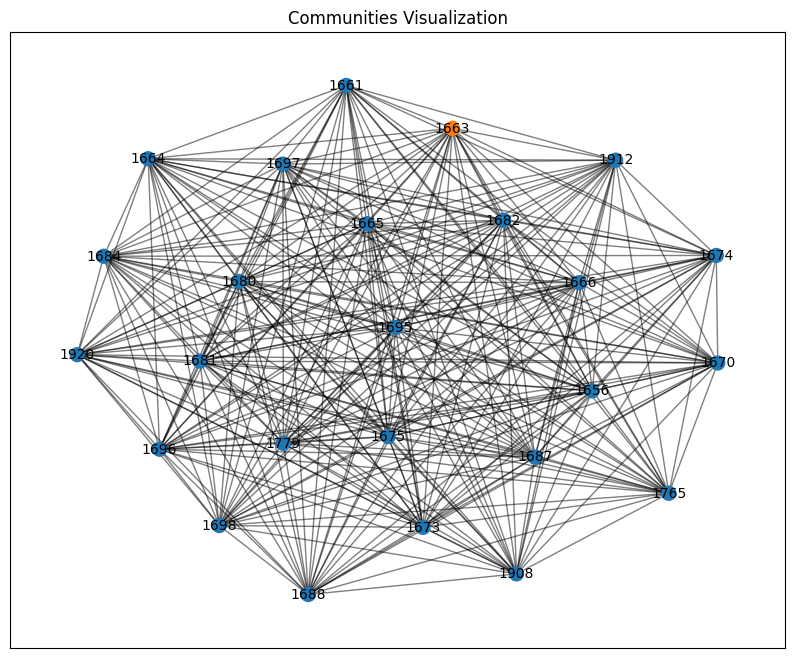

2


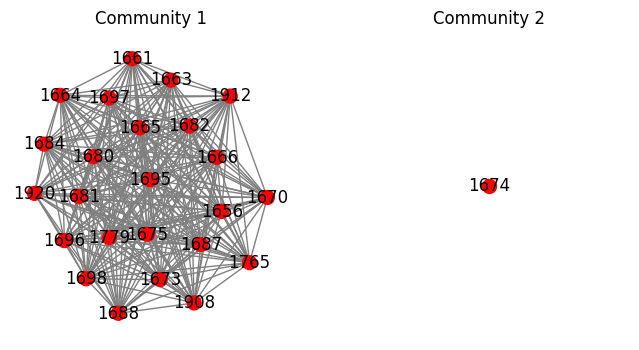

3


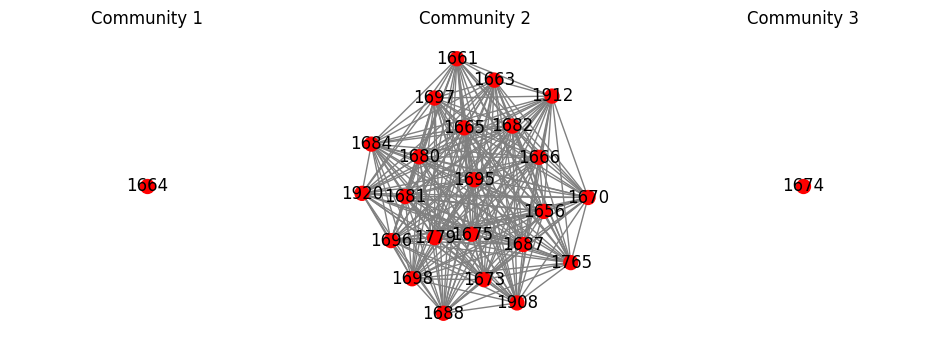

4


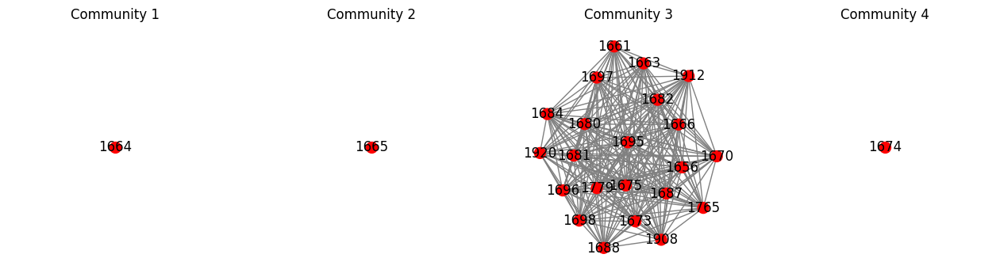

5


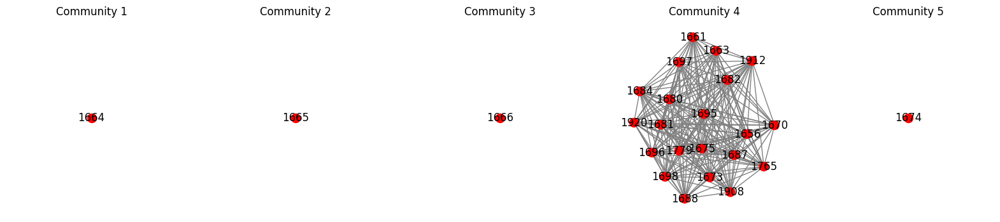

grade 5A. Number of communities: 21
Communities: [({1451, 1452, 1453, 1457, 1458, 1459, 1461, 1468, 1477, 1479, 1483, 1493, 1751, 1495, 1498, 1501, 1502, 1637, 1516, 1520, 1522}, {1511}), ({1451, 1452, 1453, 1457, 1458, 1459, 1468, 1477, 1479, 1483, 1493, 1495, 1751, 1498, 1501, 1502, 1637, 1516, 1520, 1522}, {1461}, {1511}), ({1451}, {1452, 1453, 1457, 1458, 1459, 1468, 1477, 1479, 1483, 1493, 1495, 1751, 1498, 1501, 1502, 1637, 1516, 1520, 1522}, {1461}, {1511}), ({1451}, {1452}, {1495, 1477, 1637, 1479, 1483, 1516, 1453, 1520, 1457, 1458, 1459, 1522, 1493, 1751, 1498, 1468, 1501, 1502}, {1461}, {1511}), ({1451}, {1452}, {1453}, {1495, 1637, 1477, 1479, 1483, 1516, 1520, 1457, 1458, 1459, 1522, 1493, 1751, 1498, 1468, 1501, 1502}, {1461}, {1511}), ({1451}, {1452}, {1453}, {1457}, {1495, 1637, 1477, 1479, 1483, 1516, 1520, 1458, 1522, 1459, 1493, 1751, 1498, 1468, 1501, 1502}, {1461}, {1511}), ({1451}, {1452}, {1453}, {1457}, {1458}, {1495, 1637, 1477, 1479, 1483, 1516, 1520, 1522, 14

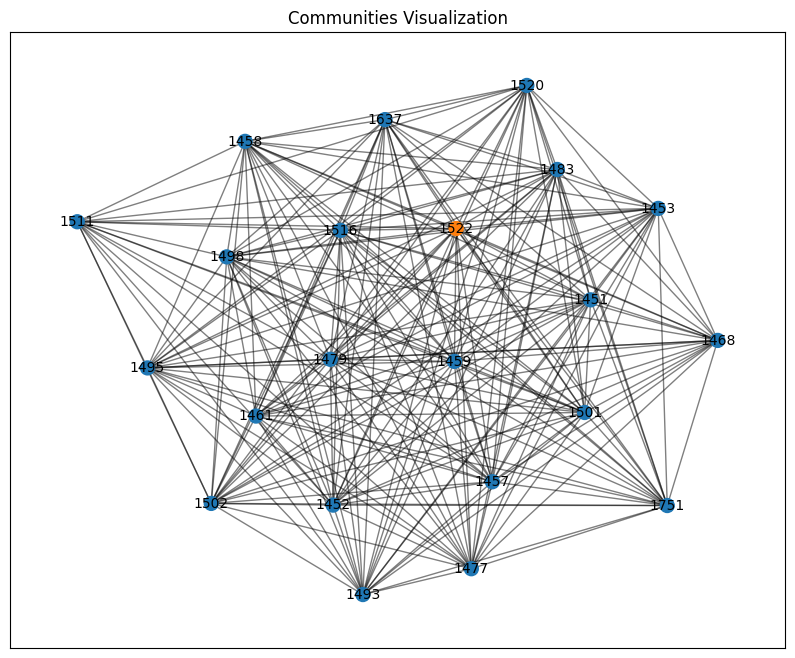

2


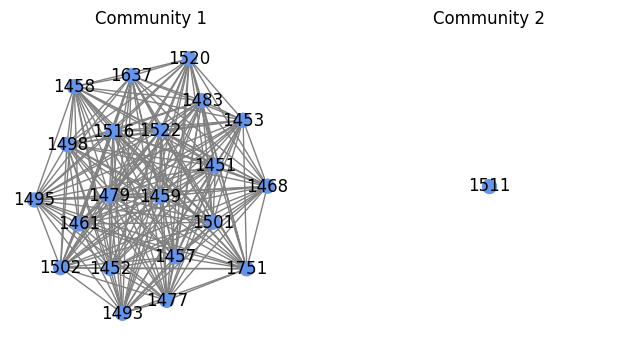

3


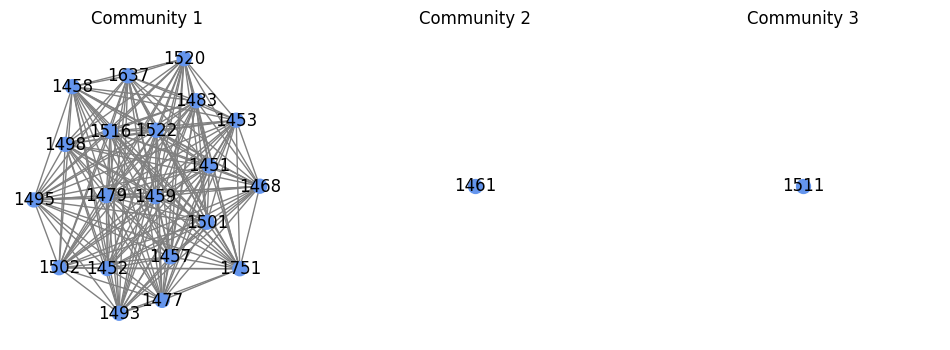

4


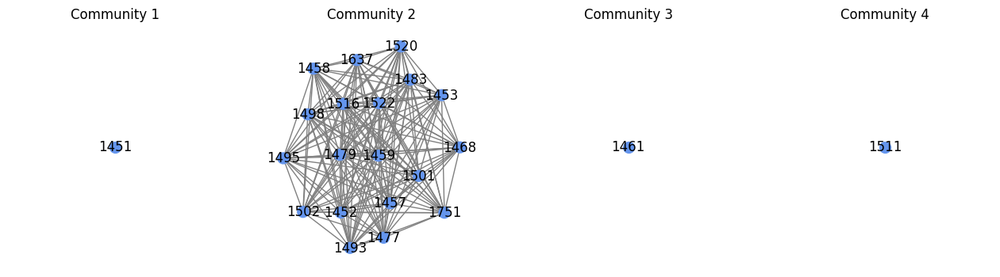

5


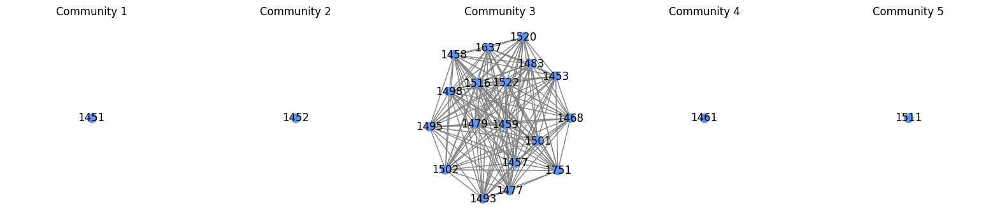

grade 5B. Number of communities: 23
Communities: [({1426, 1427, 1428, 1429, 1431, 1434, 1435, 1563, 1437, 1439, 1441, 1443, 1578, 1585, 1592, 1465, 1471, 1475, 1480, 1482, 1486, 1489, 1750}, {1430}), ({1426, 1427, 1428, 1429, 1431, 1434, 1435, 1563, 1437, 1439, 1441, 1443, 1578, 1585, 1592, 1465, 1471, 1475, 1480, 1482, 1486, 1489}, {1430}, {1750}), ({1426}, {1427, 1428, 1429, 1431, 1434, 1435, 1563, 1437, 1439, 1441, 1443, 1578, 1585, 1592, 1465, 1471, 1475, 1480, 1482, 1486, 1489}, {1430}, {1750}), ({1426}, {1427}, {1428, 1429, 1431, 1434, 1435, 1563, 1437, 1439, 1441, 1443, 1578, 1585, 1592, 1465, 1471, 1475, 1480, 1482, 1486, 1489}, {1430}, {1750}), ({1426}, {1427}, {1428}, {1429, 1431, 1434, 1435, 1563, 1437, 1439, 1441, 1443, 1578, 1585, 1592, 1465, 1471, 1475, 1480, 1482, 1486, 1489}, {1430}, {1750}), ({1426}, {1427}, {1428}, {1429}, {1430}, {1441, 1443, 1475, 1480, 1439, 1482, 1578, 1486, 1489, 1585, 1435, 1431, 1592, 1465, 1434, 1563, 1437, 1471}, {1750}), ({1426}, {1427}, {14

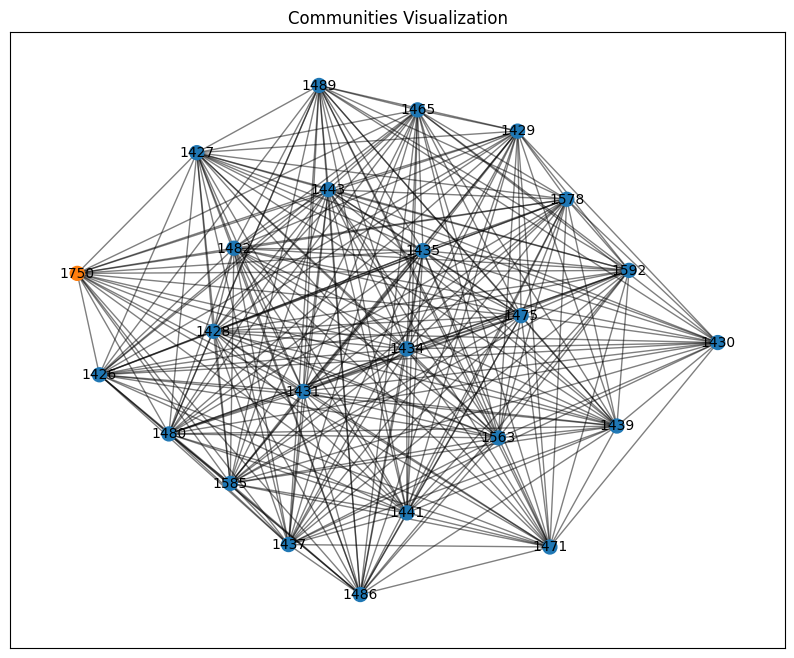

2


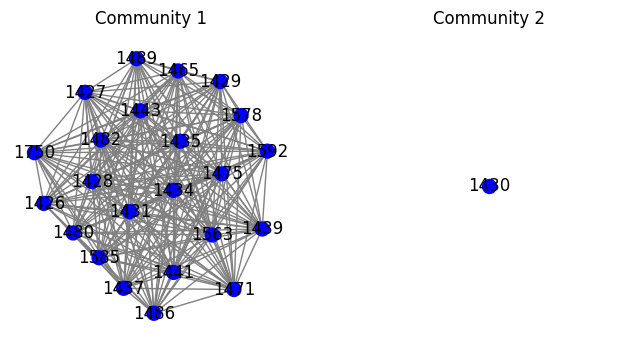

3


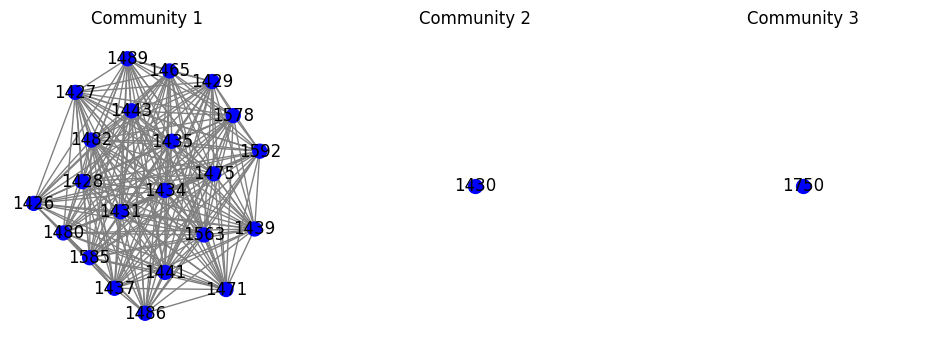

4


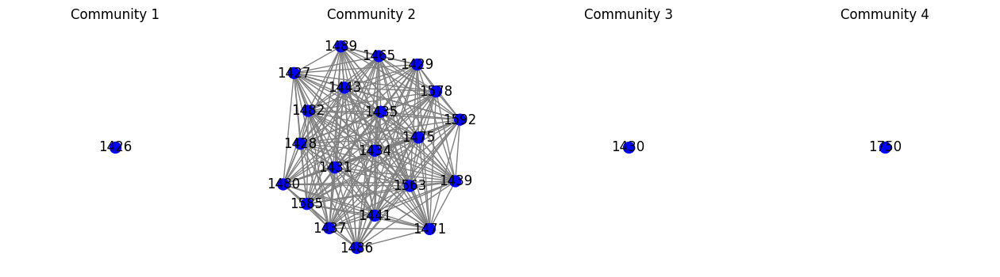

5


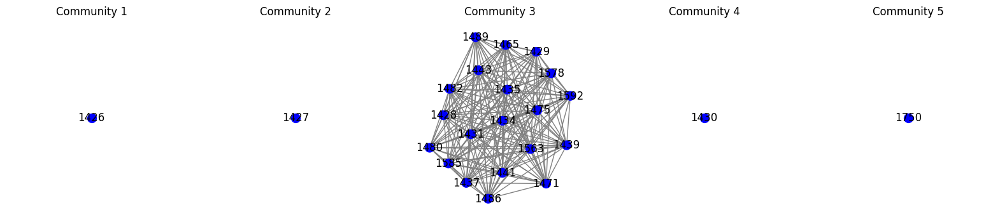

In [15]:
for grade, nodes in group.items():
    subgraph = G.subgraph(nodes)
    df_group = df[df['u'].isin(nodes) & df['v'].isin(nodes)]

    communities = list(community.girvan_newman(subgraph))
    print(f'grade {grade}. Number of communities: {len(communities)}')
    print(f'Communities: {communities}')

    pos, node_colors = assign_colors_to_communities(subgraph, communities)

    draw_graph_with_communities(subgraph, pos, node_colors)

    draw_graph_per_community(subgraph, pos, node_colors, communities[0])

    draw_graph_per_community(subgraph, pos, node_colors, communities[1])

    draw_graph_per_community(subgraph, pos, node_colors, communities[2])

    draw_graph_per_community(subgraph, pos, node_colors, communities[3])


## Temporal Properties


*"https://dl.acm.org/doi/pdf/10.1145/1592665.1592674"*
**Temporal Distance Metrics for Social Network Analysis
**

*  The
key measure that we propose is the average temporal path
length of a network that gives us a global measure of how
fast information spreads to all the nodes of the network by
means of transitive connections between them.


In [16]:
# Implement the temporal distance algorithm
def temporal_distance(df, G, source, tmin, tmax, h):
    """ 
    df - data frame of edges for the given graph G. Colums: u, v, time (not weighted!)
    """
    # Initialize D and R
    D = {node: float('inf') for node in G.nodes()} # "Distance"
    T = {node: float('inf') for node in G.nodes()} # "First Time of reachability"
    R = {node: False for node in G.nodes()} # "Reachable"
    
    T[source] = 0
    D[source] = 0
    R[source] = True

    # Iterate over time windows
    for t in range(tmin, tmax + 1, 20):  # Assuming time window of 20
        # Perform DFS within the horizon h
        stack = [(source, 0)]
        for node in G.nodes():
            if R[node]:
                stack.append((node, 0))
        if len(stack) == G.number_of_edges():
            break
        while stack:
            node, depth = stack.pop()
            if depth < h:
                # the neighbors of node at time t
                neighbors_t = df[(df['u'] == node) & (df['time'] == t)]['v'].tolist() + df[(df['v'] == node) & (df['time'] == t)]['u'].tolist()
                for neighbor in neighbors_t:
                    if (not R[neighbor]):
                        R[neighbor] = True
                        T[neighbor] = (t-tmin)/20
                        D[neighbor] = D[node] + 1
                        stack.append((neighbor, depth + 1))
                    elif (T[neighbor] == (t-tmin)/20 and D[neighbor] > D[node] + 1):
                        D[neighbor] = D[node] + 1
                        stack.append((neighbor, depth + 1))
                    
    return T, D

# Example usage
tmin = df['time'].min()
tmax = tmin + 20*180 #df['time'].max()
h = 3  # Example horizon
source = 1426  # Example source node

for grade, nodes in group.items():
    subgraph = G.subgraph(nodes)
    source = list(subgraph.nodes)[0]  # Example source node
    df_group = df_original[df_original['u'].isin(nodes) & df_original['v'].isin(nodes)]
    print(df_group.head())
    [temporal_distances, node_distances] = temporal_distance(df_group, subgraph, source, tmin, tmax, h)

    # print the outcome:
    inf_temporal = sum(1 for value in temporal_distances.values() if value == float('inf'))
    inf_node = sum(1 for value in node_distances.values() if value == float('inf'))

    avg_temporal = sum(value for value in temporal_distances.values() if value != float('inf')) / (len(temporal_distances) - inf_temporal)
    avg_node = sum(value for value in node_distances.values() if value != float('inf')) / (len(node_distances) - inf_node)

    print(f"Number of inf values in temporal distances: {inf_temporal}")
    print(f"Number of inf values in node distances: {inf_node}")
    print(f"Average of non-inf temporal distances: {avg_temporal}")
    print(f"Average of non-inf node distances: {avg_node}")

      time     u     v grade_u grade_v
270  31520  1711  1752      1A      1A
324  31600  1711  1752      1A      1A
470  31780  1711  1752      1A      1A
517  31840  1711  1752      1A      1A
539  31880  1711  1752      1A      1A
Number of inf values in temporal distances: 3
Number of inf values in node distances: 3
Average of non-inf temporal distances: 50.6
Average of non-inf node distances: 4.85
        time     u     v grade_u grade_v
47342  54860  1656  1661      1B      1B
47394  54920  1656  1661      1B      1B
47418  54940  1656  1661      1B      1B
47495  55000  1656  1661      1B      1B
47523  55020  1656  1661      1B      1B
Number of inf values in temporal distances: 0
Number of inf values in node distances: 0
Average of non-inf temporal distances: 93.48
Average of non-inf node distances: 3.92
        time     u     v grade_u grade_v
829    32120  1451  1452      5A      5A
1037   32280  1451  1452      5A      5A
2759   33800  1451  1452      5A      5A
9728   3700

### Now, do a matrix of temporal distances

In [17]:
# Implement the temporal distance algorithm
def temporal_distance(df, G, source, tmin, tmax, h):
    """ 
    df - data frame of edges for the given graph G. Colums: u, v, time (not weighted!)
    """
    # Initialize D and R
    D = {node: float('inf') for node in G.nodes()} # "Distance"
    T = {node: float('inf') for node in G.nodes()} # "First Time of reachability"
    R = {node: False for node in G.nodes()} # "Reachable"
    
    T[source] = 0
    D[source] = 0
    R[source] = True

    # Iterate over time windows
    for t in range(tmin, tmax + 1, 20):  # Assuming time window of 20
        # Perform DFS within the horizon h
        stack = [(source, 0)]
        for node in G.nodes():
            if R[node]:
                stack.append((node, 0))
        if len(stack) == G.number_of_nodes():
            break
        while stack:
            node, depth = stack.pop()
            if depth < h:
                # the neighbors of node at time t
                neighbors_t = df[(df['u'] == node) & (df['time'] == t)]['v'].tolist() + df[(df['v'] == node) & (df['time'] == t)]['u'].tolist()
                for neighbor in neighbors_t:
                    if (not R[neighbor]):
                        R[neighbor] = True
                        T[neighbor] = (t-tmin)/20
                        D[neighbor] = D[node] + 1
                        stack.append((neighbor, depth + 1))
                    elif (T[neighbor] == (t-tmin)/20 and D[neighbor] > D[node] + 1):
                        D[neighbor] = D[node] + 1
                        stack.append((neighbor, depth + 1))
                    
    return T, D

# Example usage
tmin = df['time'].min()
tmax = tmin + 20*180 #df['time'].max()
h = 3  # Example horizon
source = 1426  # Example source node

for grade, nodes in group.items():
    subgraph = G.subgraph(nodes)
    df_group = df_original[df_original['u'].isin(nodes) & df_original['v'].isin(nodes)]
    #nodes_inverse = {node: i for i, node in enumerate(nodes)}

    T = np.zeros((len(nodes), len(nodes)))
    D = np.zeros((len(nodes), len(nodes)))
    for node_id, source in enumerate(nodes):
        [temporal_distances, node_distances] = temporal_distance(df_group, subgraph, source, tmin, tmax, h)
        T[node_id, :] = [temporal_distances[node] for node in nodes]
        D[node_id, :] = [node_distances[node] for node in nodes]

    # Calculate the number of inf values and the average of non-inf values for T and D matrices
    inf_temporal = np.sum(np.isinf(T))
    inf_node = np.sum(np.isinf(D))

    avg_temporal = np.sum(T[np.isfinite(T)]) / (T.size - inf_temporal)
    avg_node = np.sum(D[np.isfinite(D)]) / (D.size - inf_node)

    print(f"Grade: {grade}")
    print(f"Number of inf values in temporal distances: {inf_temporal}")
    print(f"Number of inf values in node distances: {inf_node}")
    print(f"Average of non-inf temporal distances: {avg_temporal}")
    print(f"Average of non-inf node distances: {avg_node}")

KeyboardInterrupt: 

In [18]:
print( (df['time'].max() - df['time'].min())/20)

print((df['time'].max() - df['time'].min())/(20*180))

5845.0
32.47222222222222


In [21]:
d1_min = 31220
d1_max = 62300

d2_min = 117240
d2_max = 148120

c:\Users\Dell 5520\Anaconda3\lib\site-packages\ipykernel_launcher.py:89: RuntimeWarning: divide by zero encountered in true_divide


time 31220 done.
time 33020 done.
time 34820 done.
time 36620 done.
time 38420 done.
time 40220 done.
time 42020 done.
time 43820 done.
time 45620 done.
time 47420 done.
time 49220 done.
time 51020 done.
time 52820 done.


c:\Users\Dell 5520\Anaconda3\lib\site-packages\ipykernel_launcher.py:81: RuntimeWarning: invalid value encountered in double_scalars
c:\Users\Dell 5520\Anaconda3\lib\site-packages\ipykernel_launcher.py:82: RuntimeWarning: invalid value encountered in double_scalars


time 54620 done.
time 56420 done.


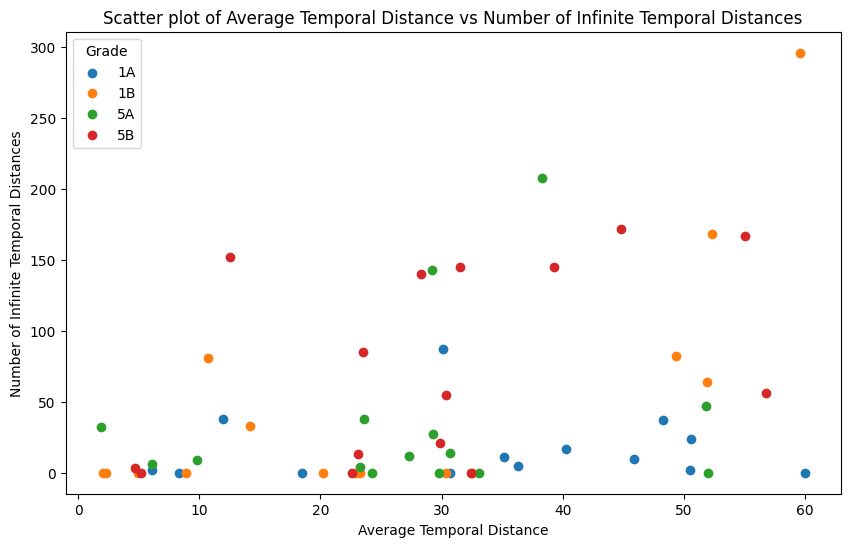

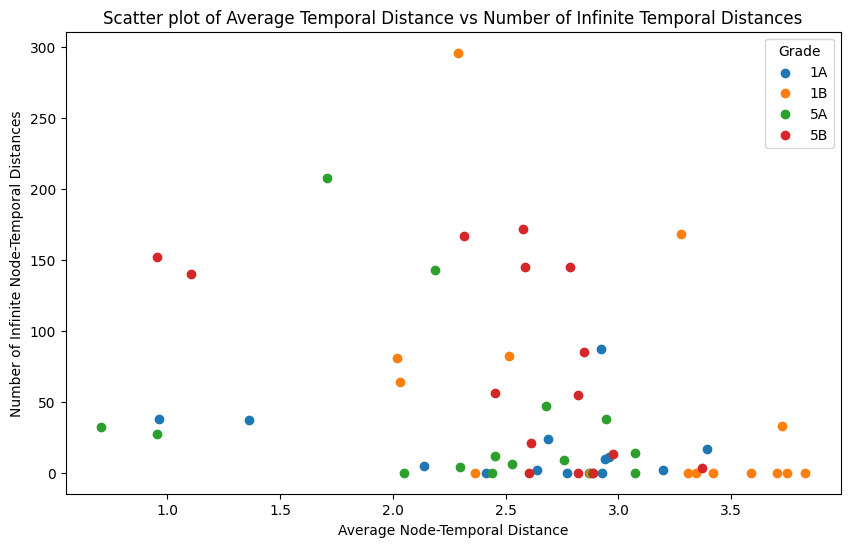

In [22]:
from collections import defaultdict
import numpy as np

def preprocess_temporal_adjacency(df):
    """Preprocess to create a dictionary of adjacency lists by time."""
    temporal_adj = defaultdict(lambda: defaultdict(list))
    for _, row in df.iterrows():
        temporal_adj[row['time']][row['u']].append(row['v'])
        temporal_adj[row['time']][row['v']].append(row['u'])
    return temporal_adj

def temporal_distance_optimized(temporal_adj, G, source, tmin, tmax, h):
    """
    Optimized temporal distance calculation.
    """
    # Initialize D, T, and R
    D = {node: float('inf') for node in G.nodes()}  # Distance
    T = {node: float('inf') for node in G.nodes()}  # First time of reachability
    R = {node: False for node in G.nodes()}  # Reachable

    D[source] = 0
    T[source] = 0
    R[source] = True

    # Iterate over time windows
    for t in range(tmin, tmax + 1, 20):
        stack = [(node, 0) for node in G.nodes() if R[node]]

        while stack:
            node, depth = stack.pop()
            if depth < h:
                neighbors_t = temporal_adj[t].get(node, [])
                for neighbor in neighbors_t:
                    if not R[neighbor]:
                        R[neighbor] = True
                        T[neighbor] = (t - tmin) / 20
                        D[neighbor] = D[node] + 1
                        stack.append((neighbor, depth + 1))
                    elif T[neighbor] == (t - tmin) / 20 and D[neighbor] > D[node] + 1:
                        D[neighbor] = D[node] + 1
                        stack.append((neighbor, depth + 1))

    return T, D

# # Example usage with preprocessing
# tmin = df['time'].min()
# tmax = tmin + 20 * 180
# h = 3  # Horizon


def run_temporal_distance_analysis(tmin_dict, tmax_dict, h):
    results = []

    for grade, nodes in group.items():
        subgraph = G.subgraph(nodes)
        df_group = df_original[df_original['u'].isin(nodes) & df_original['v'].isin(nodes)]
        temporal_adj = preprocess_temporal_adjacency(df_group)

        # Filter nodes that appear at least once in the given timeframe
        nodes_in_timeframe = set(df_group[(df_group['time'] >= tmin_dict[grade]) & (df_group['time'] <= tmax_dict[grade])]['u']).union(
            set(df_group[(df_group['time'] >= tmin_dict[grade]) & (df_group['time'] <= tmax_dict[grade])]['v'])
        )
        nodes = list(nodes_in_timeframe)

        T = np.zeros((len(nodes), len(nodes)))
        D = np.zeros((len(nodes), len(nodes)))

        tmin = tmin_dict[grade]
        tmax = tmax_dict[grade]

        for node_id, source in enumerate(nodes):
            temporal_distances, node_distances = temporal_distance_optimized(
                temporal_adj, subgraph, source, tmin, tmax, h
            )
            T[node_id, :] = [temporal_distances[node] for node in nodes]
            D[node_id, :] = [node_distances[node] for node in nodes]

        inf_temporal = np.sum(np.isinf(T))
        inf_node = np.sum(np.isinf(D))

        avg_temporal = np.sum(T[np.isfinite(T)]) / (T.size - inf_temporal)
        avg_node = np.sum(D[np.isfinite(D)]) / (D.size - inf_node)
        results.append({
            'grade': grade,
            'inf_temporal': inf_temporal,
            'inf_node': inf_node,
            'avg_temporal': avg_temporal,
            'avg_node': avg_node,
            'efficiency': np.sum(1/T[np.isfinite(T)]),
            'T_matrix': T,
            'D_matrix': D
        })

    return results

# Example usage with preprocessing
tmin_dict = {'1A': 36020, '1B': 36020, '5A': 36020, '5B': 36020}
tmax_dict = {'1A': d1_max, '1B': d1_max, '5A': d1_max, '5B': d1_max}
h = 3  # Horizon

all_results = []
bin_size = 1800  # 30 minutes in seconds

for increase in range(0, tmax_dict['1A']-tmin_dict['1A'], bin_size):

    tmin_dict_here = {x: d1_min + increase for x in group.keys()}
    tmax_dict_here = {x: d1_min + 30*60 + increase for x in group.keys()}

    results = run_temporal_distance_analysis(tmin_dict_here, tmax_dict_here, h)
    all_results.extend(results)
    print(f'time {d1_min + increase} done.')



# Convert results to a DataFrame for easier plotting
results_df = pd.DataFrame(all_results)

# Make a scatterplot of the results
import matplotlib.pyplot as plt

# Create a scatter plot
plt.figure(figsize=(10, 6))
for grade in results_df['grade'].unique():
    subset = results_df[results_df['grade'] == grade]
    plt.scatter(subset['avg_temporal'], subset['inf_temporal'], label=grade)

plt.xlabel('Average Temporal Distance')
plt.ylabel('Number of Infinite Temporal Distances')
plt.title('Scatter plot of Average Temporal Distance vs Number of Infinite Temporal Distances')
plt.legend(title='Grade')
plt.show()

# Create a scatter plot
plt.figure(figsize=(10, 6))
for grade in results_df['grade'].unique():
    subset = results_df[results_df['grade'] == grade]
    plt.scatter(subset['avg_node'], subset['inf_node'], label=grade)

plt.xlabel('Average Node-Temporal Distance')
plt.ylabel('Number of Infinite Node-Temporal Distances')
plt.title('Scatter plot of Average Temporal Distance vs Number of Infinite Temporal Distances')
plt.legend(title='Grade')
plt.show()


In [23]:
all_results

[{'grade': '1A',
  'inf_temporal': 2,
  'inf_node': 2,
  'avg_temporal': 50.472361809045225,
  'avg_node': 3.1959798994974875,
  'efficiency': inf,
  'T_matrix': array([[ 0., 59., 60., 48.,  6., 63., 59., 36., 61., 59., 63., 37., 61.,
          61., 61., 61., 70., 73.,  6., 68.],
         [60.,  0., 60., 69., 62., 63., 59., 59., 61., 59., 63., 84., 61.,
          61., 61., 61., 70., 73., 59., 68.],
         [60., 60.,  0., 69., 62., 71., 68., 60., 71., inf, 75., 84., inf,
          71., 70., 77., 74., 77., 62., 77.],
         [60., 59., 60.,  0., 62., 20., 57., 50., 55., 37., 40., 84., 40.,
          37.,  5., 15.,  8.,  5., 48., 41.],
         [ 6., 59., 60., 48.,  0., 63.,  3.,  4., 61., 59., 63., 37., 57.,
          61., 61., 61., 70., 73.,  5., 68.],
         [60., 59., 60., 15., 62.,  0., 59., 50., 61., 59., 40., 84., 61.,
          61., 53.,  8., 53., 73., 48., 41.],
         [ 6., 59., 60., 48.,  3., 63.,  0.,  4., 61., 59., 63., 37., 57.,
          61., 61., 61., 70., 73.,  5.,

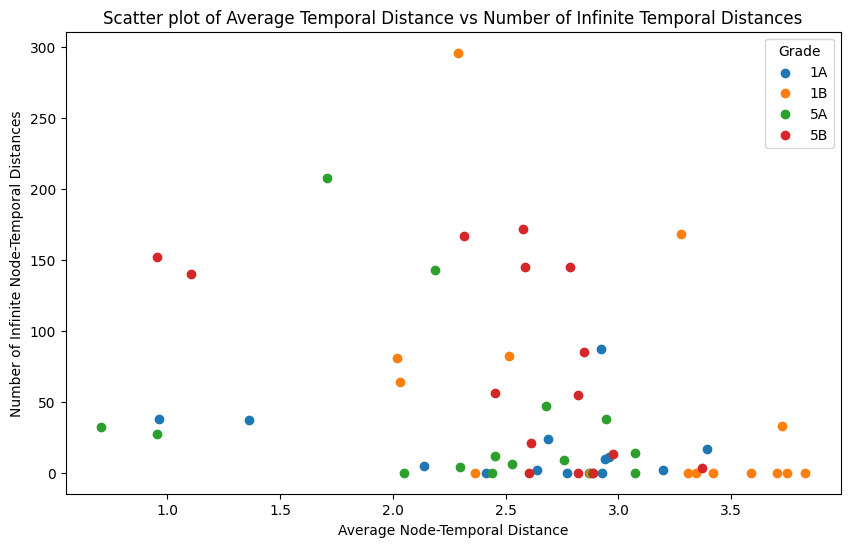

In [24]:


# Create a scatter plot
plt.figure(figsize=(10, 6))
for grade in results_df['grade'].unique():
    subset = results_df[results_df['grade'] == grade]
    plt.scatter(subset['avg_node'], subset['inf_node'], label=grade)

plt.xlabel('Average Node-Temporal Distance')
plt.ylabel('Number of Infinite Node-Temporal Distances')
plt.title('Scatter plot of Average Temporal Distance vs Number of Infinite Temporal Distances')
plt.legend(title='Grade')
plt.show()

In [25]:
from statistics import mean


for grade in results_df['grade'].unique():
    subset = results_df[(results_df['grade'] == grade) & (results_df['avg_temporal'] != 0)]
    print(f'Grade: {grade}. Avg temp: {mean(subset["avg_temporal"])}. Avg node: {mean(subset["avg_node"])}')
    print(subset)

Grade: 1A. Avg temp: nan. Avg node: nan
   grade  inf_temporal  inf_node  avg_temporal  avg_node  efficiency  \
0     1A             2         2     50.472362  3.195980         inf   
4     1A             0         0     18.500000  2.870000         inf   
8     1A            17        17     40.289817  3.391645         inf   
12    1A            11        11     35.187661  2.956298         inf   
16    1A             0         0      8.360544  2.414966         inf   
20    1A            87        87     30.144068  2.923729         inf   
24    1A             0         0     30.689342  2.770975         inf   
28    1A            38        38     12.000000  0.961538         inf   
32    1A            37        37     48.272727  1.363636         inf   
36    1A             5         5     36.345324  2.136691         inf   
40    1A             0         0     60.038549  2.927438         inf   
44    1A             2         2      6.141079  2.636929         inf   
48    1A            24  

In [26]:
# Efficiency?
for grade in results_df['grade'].unique():
    #subset = results_df[(results_df['grade'] == grade) & (results_df['avg_temporal'] != 0)]
    print(f'Grade: {grade}. Avg temp: {mean(subset["avg_temporal"])}. Avg node: {mean(subset["avg_node"])}')
    print(subset)

Grade: 1A. Avg temp: 29.342218721165704. Avg node: 2.514076936210919
   grade  inf_temporal  inf_node  avg_temporal  avg_node  efficiency  \
3     5B           145       145     39.255208  2.786458         inf   
7     5B           152       152     12.522727  0.954545         inf   
11    5B             0         0     32.429112  2.886578         inf   
15    5B             3         3      4.711027  3.368821         inf   
19    5B           167       167     55.065693  2.317518         inf   
23    5B            55        55     30.392405  2.818565         inf   
27    5B            85        85     23.502809  2.845506         inf   
31    5B             0         0     22.581633  2.602041         inf   
35    5B            21        21     29.887255  2.612745         inf   
39    5B           140       140     28.303571  1.107143         inf   
43    5B            56        56     56.809701  2.451493         inf   
47    5B            13        13     23.121495  2.976636         in

Lets identify when the children are taking breaks.

In [27]:
(62300-tmin) // 3600
(tmax-117240) //3600

-23

In [28]:
tmin = df['time'].min()
tmax = df['time'].max()

print(tmin, tmax)

def timestamp_to_time(timestamp):

    is_day_2 = (timestamp > 117000)
    # Convert timestamp to seconds since start of the day
    seconds_since_start = (timestamp - (117240 if is_day_2 else d1_min))

    # Calculate hours, minutes, and seconds
    hours = 8 + (seconds_since_start // 3600)
    minutes = (30 if is_day_2 else 45) + ((seconds_since_start % 3600) // 60)
    seconds = seconds_since_start % 60
    # Adjust for overflow in minutes
    if minutes >= 60:
        hours += 1
        minutes -= 60
    return f"{int(hours):02}:{int(minutes):02}:{int(seconds):02}"

def time_to_timestamp(time_str, day=1):
    # Parse the time string
    hours, minutes, seconds = map(int, time_str.split(':'))
    # Calculate total seconds since start of the day
    total_seconds = (hours - 8) * 3600 + (minutes - 45) * 60 + seconds
    # Convert to timestamp
    timestamp = (d1_min if day==1 else 117240) + total_seconds
    return timestamp

# Example usage
print(timestamp_to_time(tmin))  # Should print "08:45:00"
print(timestamp_to_time(62300))  # Should print "17:20:00"
print(time_to_timestamp("08:45:00"))  # Should return tmin
print(time_to_timestamp("17:20:00"))  # Should return tmax


print(timestamp_to_time(117240))  # Should print "08:45:00"
print(timestamp_to_time(tmax))  # Should print "17:20:00"
print(time_to_timestamp("08:45:00", day=2))  # Should return tmin
print(time_to_timestamp("17:05:00", day=2))  # Should return tmax




31220 148120
08:45:00
17:23:00
31220
62120
08:30:00
17:04:40
117240
147240


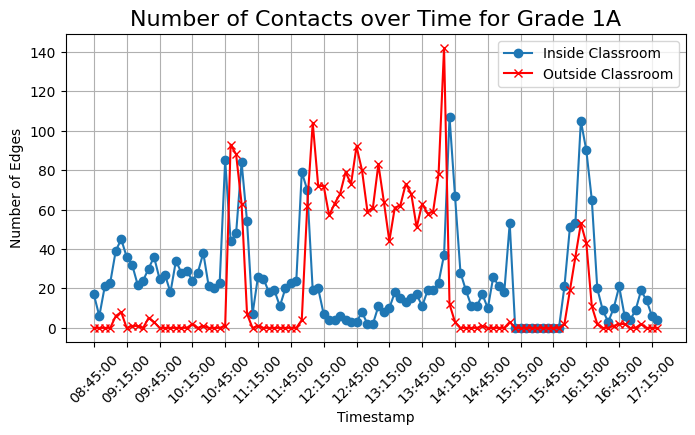

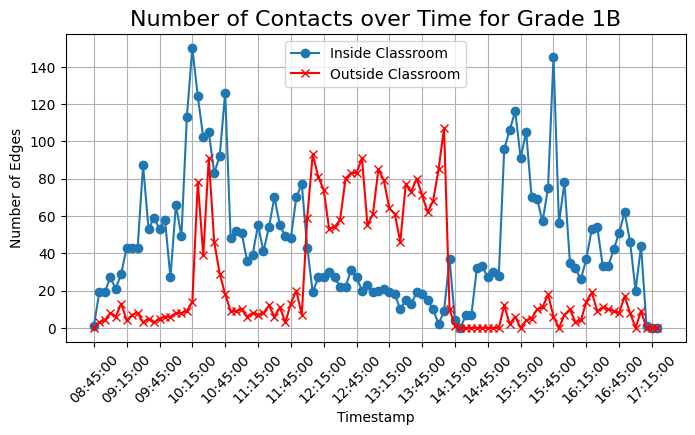

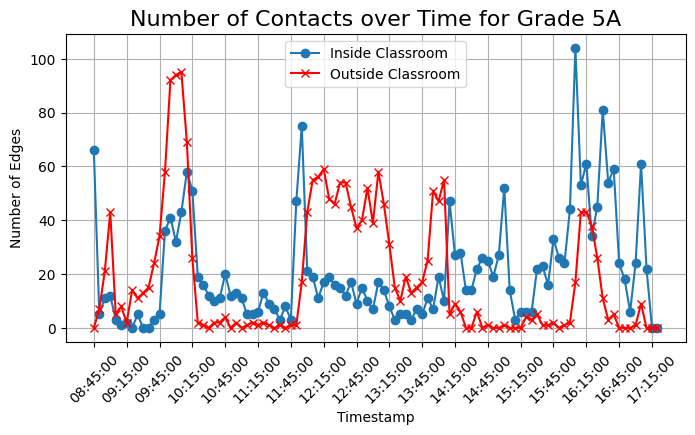

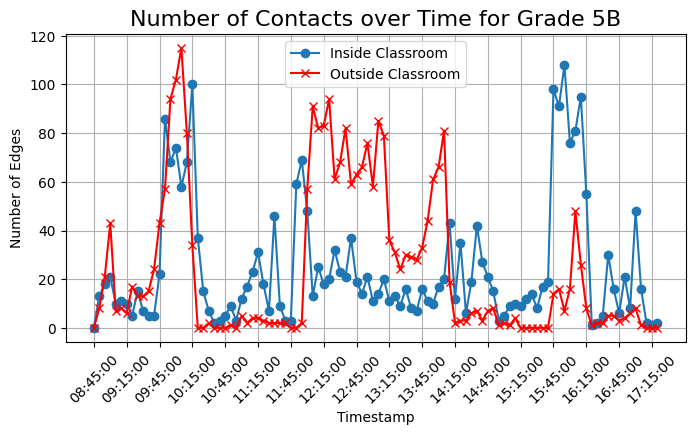

In [44]:
for grade, nodes in group.items():
    subgraph = G.subgraph(nodes)
    df_group = df[df['u'].isin(nodes) & df['v'].isin(nodes)]
    # Define the time range and bucket size
    time_range = range(d1_min, d1_max + 1, 300)  # 5 minutes = 300 seconds
    edge_counts = []

    # Count the number of edges in each time bucket
    for start_time in time_range:
        end_time = start_time + 300
        count = df_group[(df_group['time'] >= start_time) & (df_group['time'] < end_time)].shape[0]
        edge_counts.append(count)
    
    # Count the number of edges outside of classroom
    df_group_outside = df[(df['u'].isin(nodes) & ~df['v'].isin(nodes)) | (~df['u'].isin(nodes) & df['v'].isin(nodes))]
    edge_counts_outside = []

    # Count the number of edges in each time bucket outside of classroom
    for start_time in time_range:
        end_time = start_time + 300
        count = df_group_outside[(df_group_outside['time'] >= start_time) & (df_group_outside['time'] < end_time)].shape[0]
        edge_counts_outside.append(count)

    # Plot the results
    plt.figure(figsize=(8, 4))
    plt.plot(time_range, edge_counts, marker='o', label='Inside Classroom')
    plt.plot(time_range, edge_counts_outside, marker='x', color='red', label='Outside Classroom')
    plt.xlabel('Timestamp')
    plt.ylabel('Number of Edges')
    plt.title(f'Number of Contacts over Time for Grade {grade}', fontsize=16)
    plt.grid(True)
    
    # Add more ticks to the x-axis
    tick_range = range(d1_min, d1_max + 1, 1800)  # 30 minutes = 1800 seconds
    tick_labels = [timestamp_to_time(tick) for tick in tick_range]
    plt.xticks(ticks=tick_range, labels=tick_labels, rotation=45)
    
    plt.legend()
    plt.show()

In [30]:
first_break = {"1A": "10:40:00", "1B": "10:10:00", "5A": "09:45:00", "5B": "09:45:00"}


In [31]:

h = 1

for grade, nodes in group.items():
    tmin = time_to_timestamp(first_break[grade])
    tmax = tmin + 30*60 # 30 minutes

    subgraph = G.subgraph(nodes)
    df_group = df_original[df_original['u'].isin(nodes) & df_original['v'].isin(nodes)]
    temporal_adj = preprocess_temporal_adjacency(df_group)

    T = np.zeros((len(nodes), len(nodes)))
    D = np.zeros((len(nodes), len(nodes)))

    for node_id, source in enumerate(nodes):
        temporal_distances, node_distances = temporal_distance_optimized(
            temporal_adj, subgraph, source, tmin, tmax, h
        )
        T[node_id, :] = [temporal_distances[node] for node in nodes]
        D[node_id, :] = [node_distances[node] for node in nodes]

    inf_temporal = np.sum(np.isinf(T))
    inf_node = np.sum(np.isinf(D))

    avg_temporal = np.sum(T[np.isfinite(T)]) / (T.size - inf_temporal)
    avg_node = np.sum(D[np.isfinite(D)]) / (D.size - inf_node)

    print({
        'grade': grade,
        'inf_temporal': inf_temporal,
        'inf_node': inf_node,
        'avg_temporal': avg_temporal,
        'avg_node': avg_node,
        'efficiency': np.sum(1/T[np.isfinite(T)])
    })

for grade, nodes in group.items():
    tmin = time_to_timestamp(first_break[grade]) + 10*60
    tmax = tmin + 30*60 # 30 minutes

    subgraph = G.subgraph(nodes)
    df_group = df_original[df_original['u'].isin(nodes) & df_original['v'].isin(nodes)]
    temporal_adj = preprocess_temporal_adjacency(df_group)

    T = np.zeros((len(nodes), len(nodes)))
    D = np.zeros((len(nodes), len(nodes)))

    for node_id, source in enumerate(nodes):
        temporal_distances, node_distances = temporal_distance_optimized(
            temporal_adj, subgraph, source, tmin, tmax, h
        )
        T[node_id, :] = [temporal_distances[node] for node in nodes]
        D[node_id, :] = [node_distances[node] for node in nodes]

    inf_temporal = np.sum(np.isinf(T))
    inf_node = np.sum(np.isinf(D))

    avg_temporal = np.sum(T[np.isfinite(T)]) / (T.size - inf_temporal)
    avg_node = np.sum(D[np.isfinite(D)]) / (D.size - inf_node)

    print({
        'grade': grade,
        'inf_temporal': inf_temporal,
        'inf_node': inf_node,
        'avg_temporal': avg_temporal,
        'avg_node': avg_node,
        'efficiency': np.sum(1/T[np.isfinite(T)])
    })

for grade, nodes in group.items():
    tmin = time_to_timestamp(first_break[grade]) + 20*60
    tmax = tmin + 30*60 # 30 minutes

    subgraph = G.subgraph(nodes)
    df_group = df_original[df_original['u'].isin(nodes) & df_original['v'].isin(nodes)]
    temporal_adj = preprocess_temporal_adjacency(df_group)

    T = np.zeros((len(nodes), len(nodes)))
    D = np.zeros((len(nodes), len(nodes)))

    for node_id, source in enumerate(nodes):
        temporal_distances, node_distances = temporal_distance_optimized(
            temporal_adj, subgraph, source, tmin, tmax, h
        )
        T[node_id, :] = [temporal_distances[node] for node in nodes]
        D[node_id, :] = [node_distances[node] for node in nodes]

    inf_temporal = np.sum(np.isinf(T))
    inf_node = np.sum(np.isinf(D))

    avg_temporal = np.sum(T[np.isfinite(T)]) / (T.size - inf_temporal)
    avg_node = np.sum(D[np.isfinite(D)]) / (D.size - inf_node)

    print({
        'grade': grade,
        'inf_temporal': inf_temporal,
        'inf_node': inf_node,
        'avg_temporal': avg_temporal,
        'avg_node': avg_node,
        'efficiency': np.sum(1/T[np.isfinite(T)])
    })


c:\Users\Dell 5520\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in true_divide


{'grade': '1A', 'inf_temporal': 86, 'inf_node': 86, 'avg_temporal': 20.884875846501128, 'avg_node': 2.2776523702031604, 'efficiency': inf}
{'grade': '1B', 'inf_temporal': 0, 'inf_node': 0, 'avg_temporal': 8.6144, 'avg_node': 2.392, 'efficiency': inf}
{'grade': '5A', 'inf_temporal': 82, 'inf_node': 82, 'avg_temporal': 34.365671641791046, 'avg_node': 2.6517412935323383, 'efficiency': inf}
{'grade': '5B', 'inf_temporal': 46, 'inf_node': 46, 'avg_temporal': 33.20377358490566, 'avg_node': 2.707547169811321, 'efficiency': inf}


c:\Users\Dell 5520\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: RuntimeWarning: divide by zero encountered in true_divide


{'grade': '1A', 'inf_temporal': 86, 'inf_node': 86, 'avg_temporal': 19.31602708803612, 'avg_node': 2.625282167042889, 'efficiency': inf}
{'grade': '1B', 'inf_temporal': 0, 'inf_node': 0, 'avg_temporal': 10.1632, 'avg_node': 2.6928, 'efficiency': inf}
{'grade': '5A', 'inf_temporal': 82, 'inf_node': 82, 'avg_temporal': 19.95771144278607, 'avg_node': 3.0074626865671643, 'efficiency': inf}
{'grade': '5B', 'inf_temporal': 46, 'inf_node': 46, 'avg_temporal': 16.462264150943398, 'avg_node': 2.8754716981132074, 'efficiency': inf}


c:\Users\Dell 5520\Anaconda3\lib\site-packages\ipykernel_launcher.py:99: RuntimeWarning: divide by zero encountered in true_divide


{'grade': '1A', 'inf_temporal': 86, 'inf_node': 86, 'avg_temporal': 10.98194130925508, 'avg_node': 2.5778781038374716, 'efficiency': inf}
{'grade': '1B', 'inf_temporal': 0, 'inf_node': 0, 'avg_temporal': 7.8896, 'avg_node': 2.6352, 'efficiency': inf}
{'grade': '5A', 'inf_temporal': 82, 'inf_node': 82, 'avg_temporal': 16.059701492537314, 'avg_node': 2.5497512437810945, 'efficiency': inf}
{'grade': '5B', 'inf_temporal': 46, 'inf_node': 46, 'avg_temporal': 16.920754716981133, 'avg_node': 2.8056603773584907, 'efficiency': inf}


THERE IS SOME PATTERN!

Now, the same as before but jsut the first break:

THERE IS A SLIGHT PTTERN.

{'1A': 38120, '1B': 36320, '5A': 34820, '5B': 34820}


c:\Users\Dell 5520\Anaconda3\lib\site-packages\ipykernel_launcher.py:89: RuntimeWarning: divide by zero encountered in true_divide


time 36020 done.
[{'grade': '1A', 'inf_temporal': 0, 'inf_node': 0, 'avg_temporal': 18.90249433106576, 'avg_node': 2.750566893424036, 'efficiency': inf, 'T_matrix': array([[ 0., 15., 21., 15., 15., 22., 15., 19., 21., 15., 15., 15., 21.,
        15., 14., 15., 14.,  6., 22., 15., 47.],
       [18.,  0.,  5., 15., 15.,  1., 14.,  0., 13., 15., 14., 15.,  1.,
        15., 15., 15., 15., 18., 13., 13., 47.],
       [22., 19.,  0., 18., 15.,  5., 16.,  5., 13., 15., 21., 15.,  6.,
        21., 22., 15., 15., 25., 13., 13., 47.],
       [18., 15., 21.,  0., 16., 22., 15., 19., 21., 18., 15., 19., 21.,
        15., 15., 22., 19., 18., 22., 17., 47.],
       [22., 22., 22., 18.,  0., 22., 16., 22., 24., 15., 23., 15., 24.,
        22., 22., 15., 15., 25., 22., 15., 47.],
       [22., 19.,  5., 18., 15.,  0., 16.,  1., 13., 15., 21., 15.,  1.,
        21., 22., 15., 15., 25., 13., 13., 47.],
       [18., 14., 14., 15., 15., 15.,  0., 13., 13., 15., 14., 15., 13.,
        15., 15., 15., 15., 18

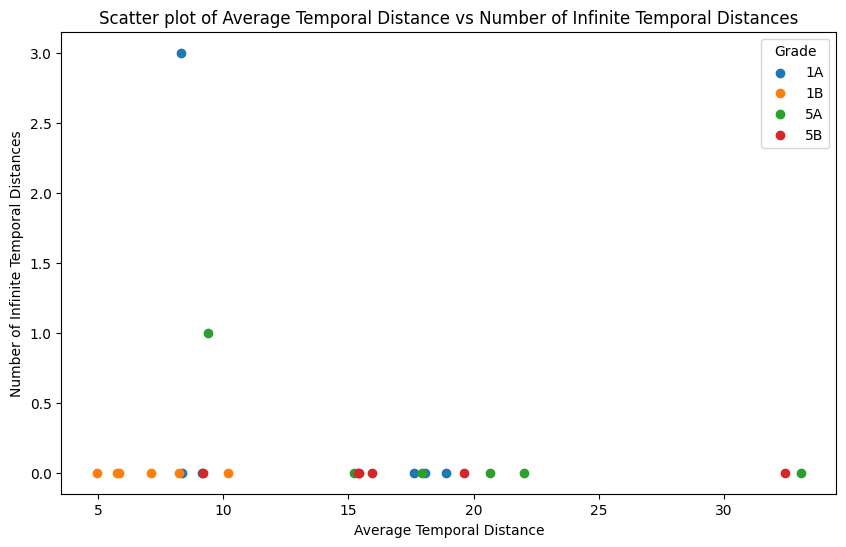

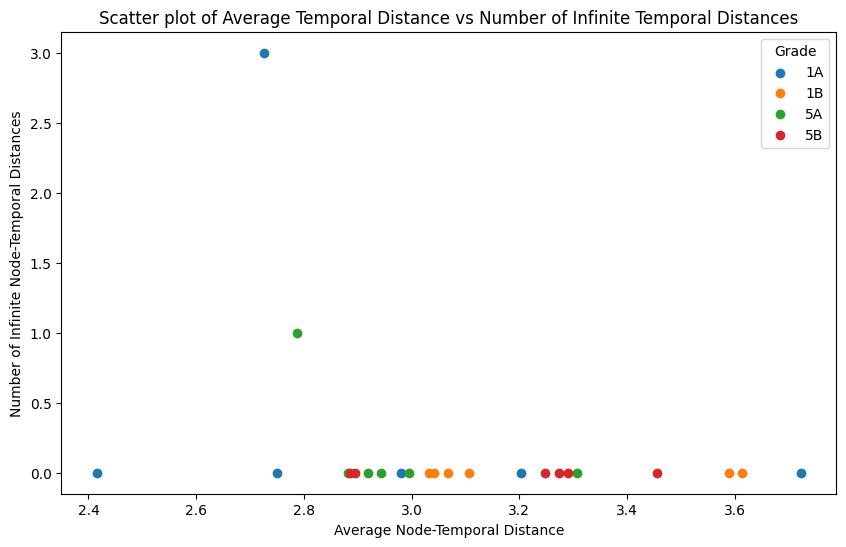

In [32]:
h = 3  # Horizon



# Example usage with preprocessing
tmin_dict = {x: time_to_timestamp(first_break[x]) for x in group.keys()}
print(tmin_dict)
tmax_dict = {x: time_to_timestamp(first_break[x]) + 30*60 for x in group.keys()}

all_results = []
bin_size = 5*60  # 5 minutes in seconds


for increase in range(0, tmax_dict['1A']-tmin_dict['1A'], bin_size):

    tmin_dict_here = {x: time_to_timestamp(first_break[x]) + increase for x in group.keys()}
    tmax_dict_here = {x: time_to_timestamp(first_break[x]) + 30*60 + increase for x in group.keys()}

    results = run_temporal_distance_analysis(tmin_dict_here, tmax_dict_here, h)
    all_results.extend(results)
    print(f'time {tmin} done.')
    print(results)

# Convert results to a DataFrame for easier plotting
results_df = pd.DataFrame(all_results)


# Make a scatterplot of the results
import matplotlib.pyplot as plt

# Create a scatter plot
plt.figure(figsize=(10, 6))
for grade in results_df['grade'].unique():
    subset = results_df[results_df['grade'] == grade]
    plt.scatter(subset['avg_temporal'], subset['inf_temporal'], label=grade)

plt.xlabel('Average Temporal Distance')
plt.ylabel('Number of Infinite Temporal Distances')
plt.title('Scatter plot of Average Temporal Distance vs Number of Infinite Temporal Distances')
plt.legend(title='Grade')
plt.show()

# Create a scatter plot
plt.figure(figsize=(10, 6))
for grade in results_df['grade'].unique():
    subset = results_df[results_df['grade'] == grade]
    plt.scatter(subset['avg_node'], subset['inf_node'], label=grade)

plt.xlabel('Average Node-Temporal Distance')
plt.ylabel('Number of Infinite Node-Temporal Distances')
plt.title('Scatter plot of Average Temporal Distance vs Number of Infinite Temporal Distances')
plt.legend(title='Grade')
plt.show()


Now, we want to plot the kids

c:\Users\Dell 5520\Anaconda3\lib\site-packages\ipykernel_launcher.py:89: RuntimeWarning: divide by zero encountered in true_divide


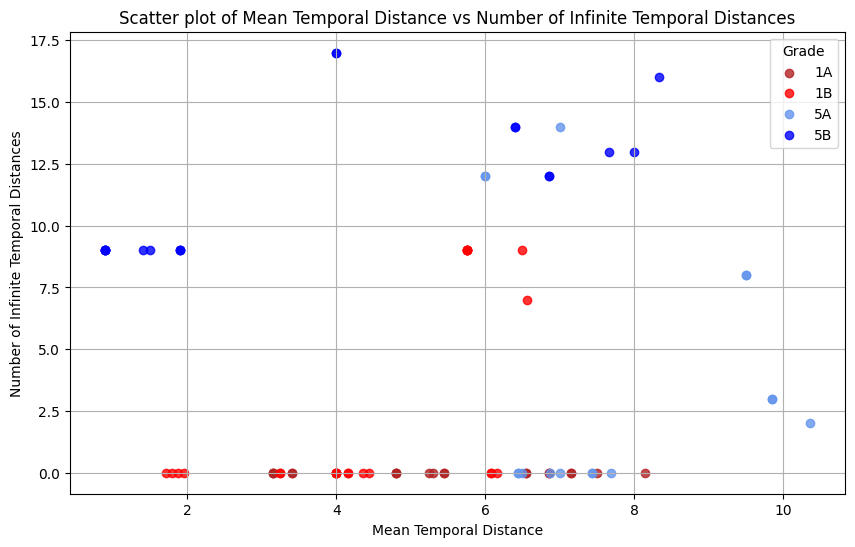

In [33]:
h = 2

tmin_dict_here = {x: time_to_timestamp(first_break[x]) + 5*60 for x in group.keys()}
tmax_dict_here = {x: time_to_timestamp(first_break[x]) + 10*60 for x in group.keys()}

results = run_temporal_distance_analysis(tmin_dict_here, tmax_dict_here, h)

# Compute mean value and number of infs for each row of T_matrix
mean_values = {grade: [] for grade in group.keys()}
num_infs = {grade: [] for grade in group.keys()}

for result in results:
    T_matrix = result['T_matrix']

    finite_T_matrix_mean = [np.mean(row[np.isfinite(row)]) for row in T_matrix]
    mean_values[result['grade']].append(finite_T_matrix_mean)
    num_infs[result['grade']].append(np.sum(np.isinf(T_matrix), axis=1))

# Create a scatter plot
plt.figure(figsize=(10, 6))

for grade in group.keys():
    mean_values_here = np.concatenate(mean_values[grade])
    num_infs_here = np.concatenate(num_infs[grade])
    plt.scatter(mean_values_here, num_infs_here, label=grade, color=grade_dict_more[grade], alpha=0.8)

plt.xlabel('Mean Temporal Distance')
plt.ylabel('Number of Infinite Temporal Distances')
plt.title('Scatter plot of Mean Temporal Distance vs Number of Infinite Temporal Distances')
plt.legend(title='Grade')
plt.grid(True)
plt.show()




Now, lets see if in the lunchtime, we have communities forming.

grade 1A


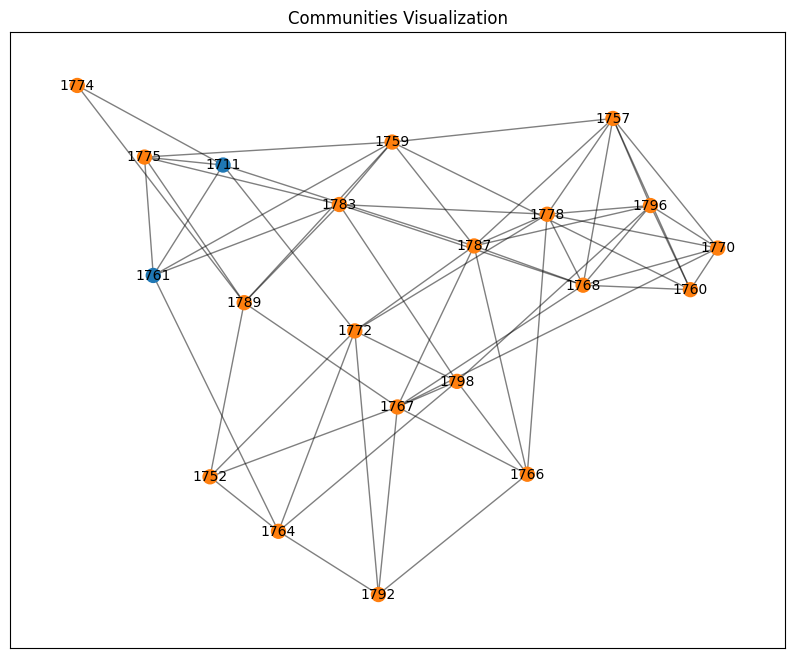

2


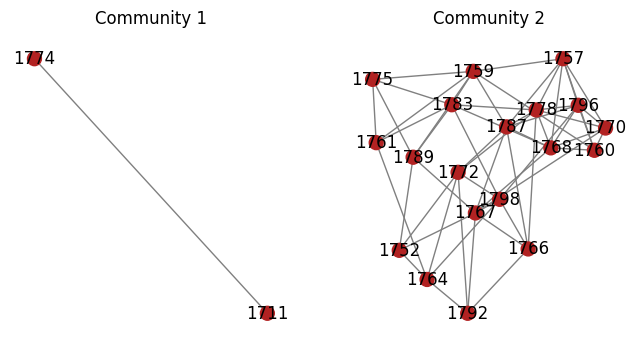

3


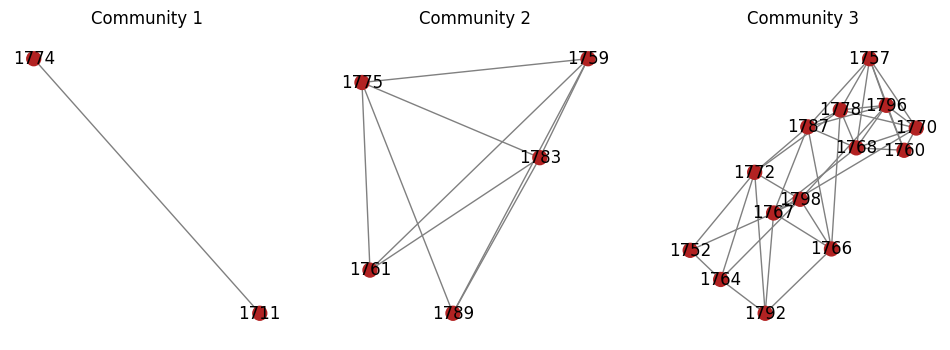

4


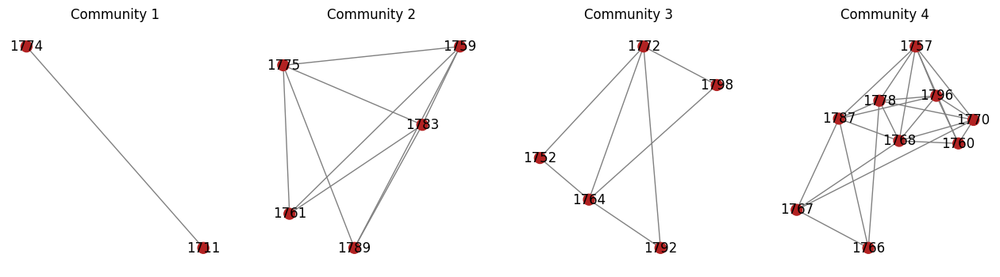

5


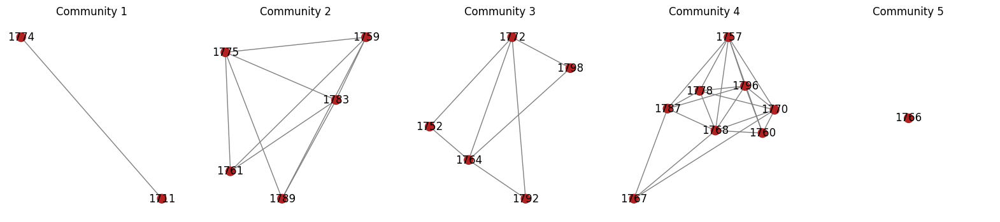

grade 1B


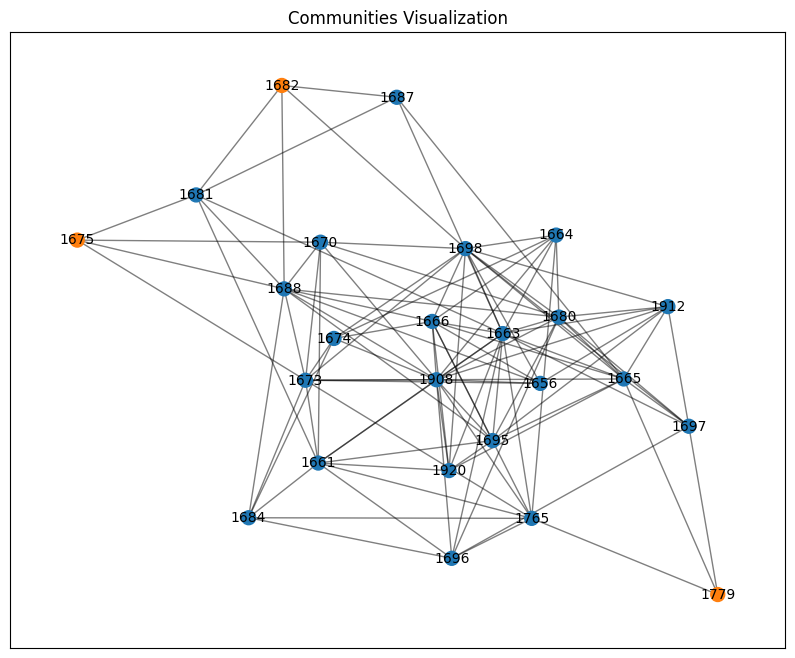

2


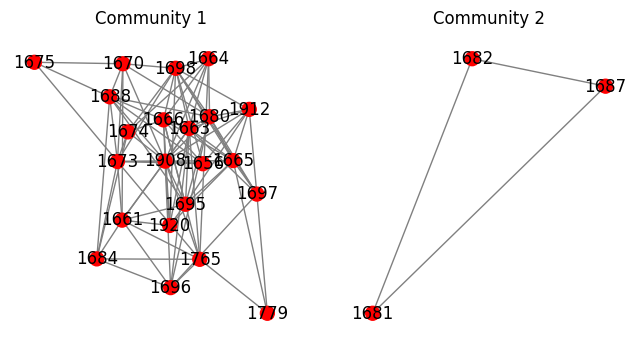

3


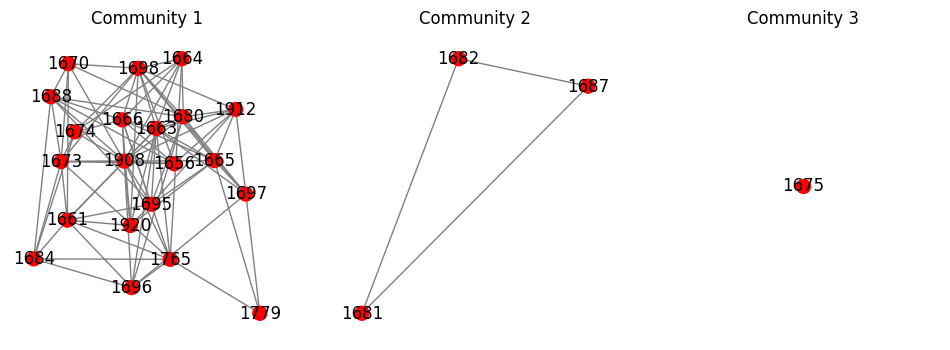

4


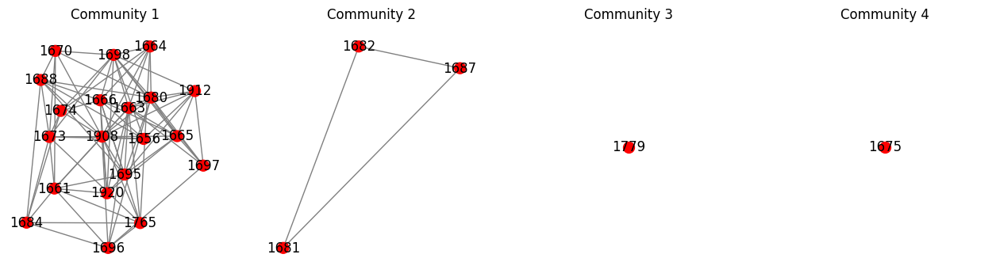

5


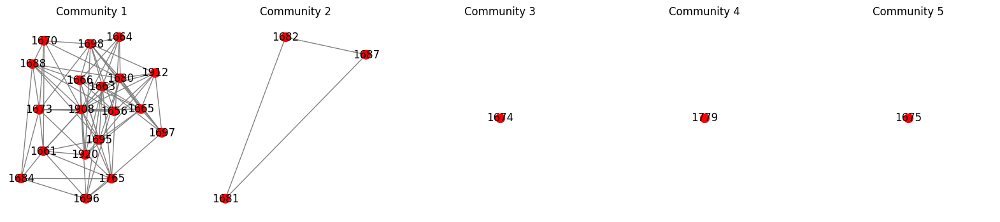

grade 5A


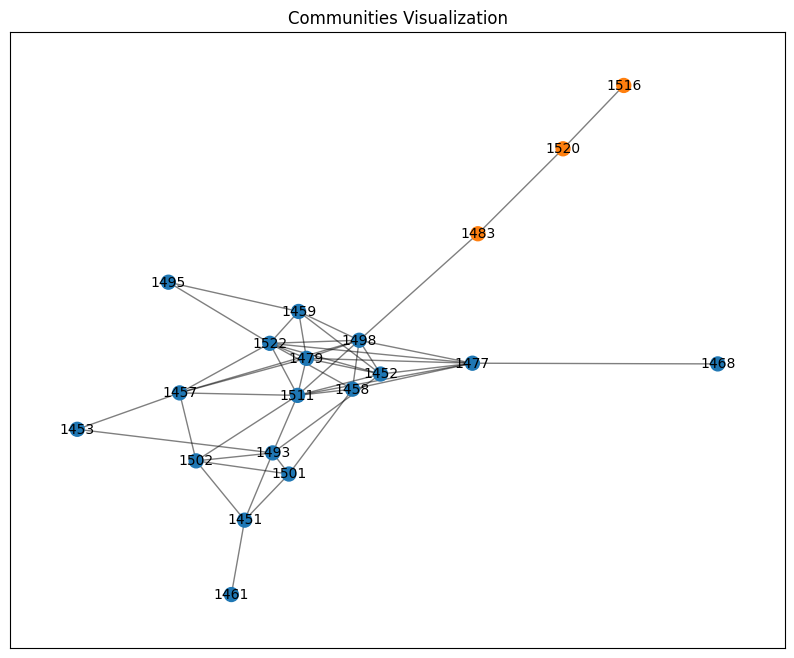

2


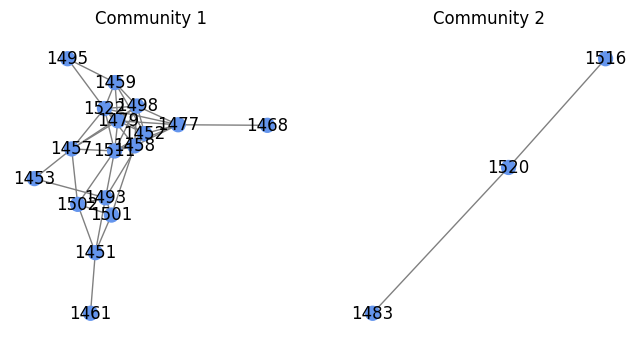

3


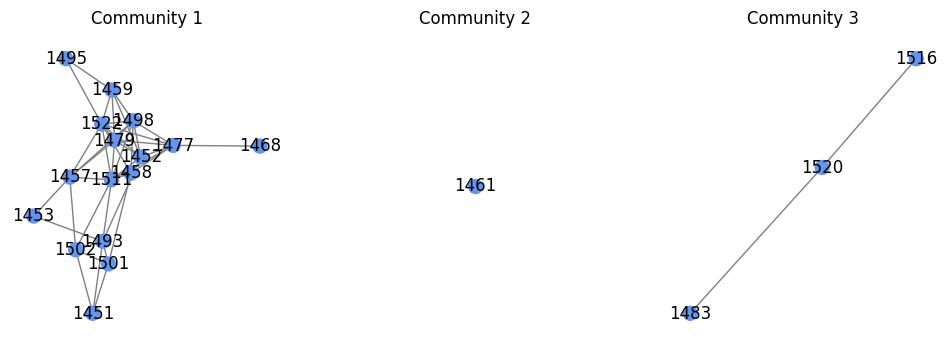

4


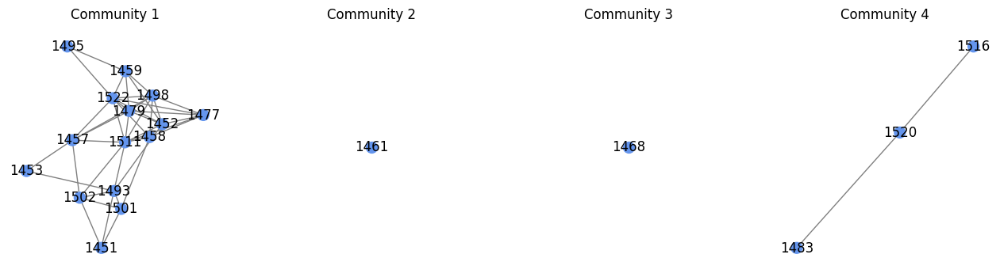

5


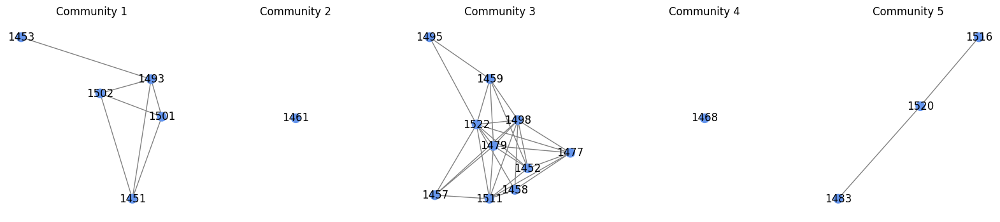

grade 5B


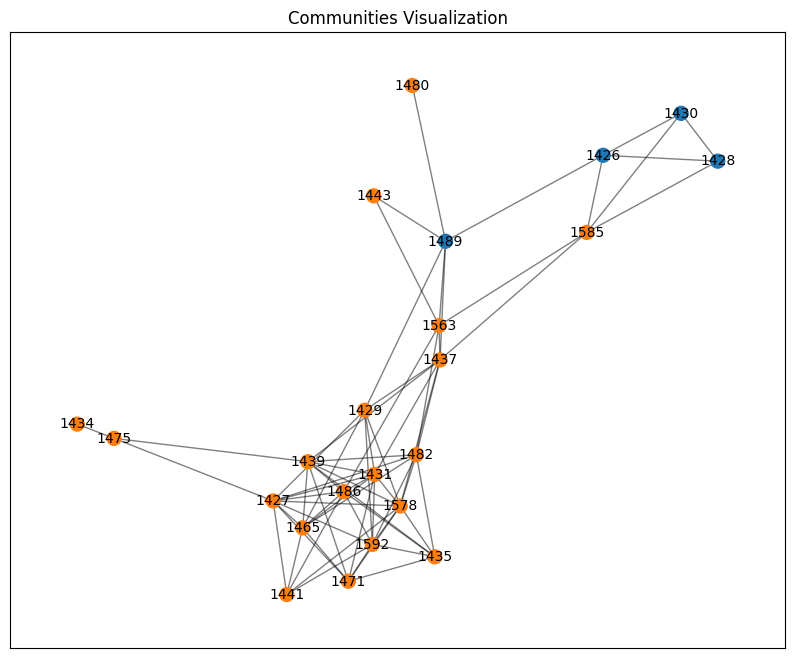

2


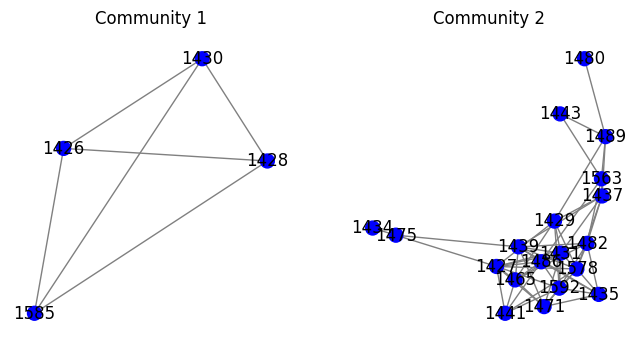

3


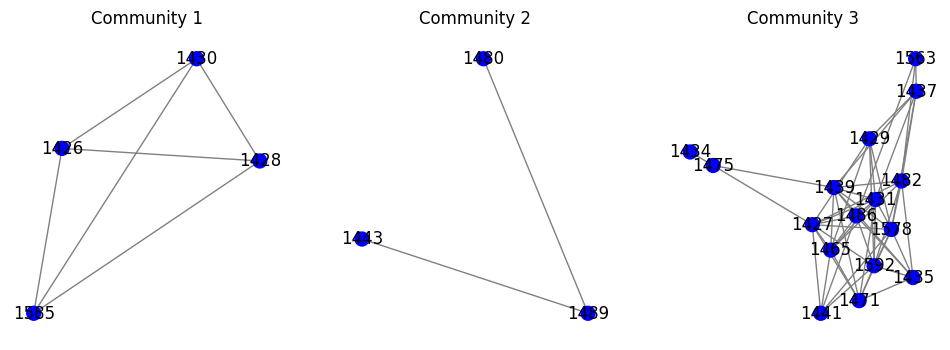

4


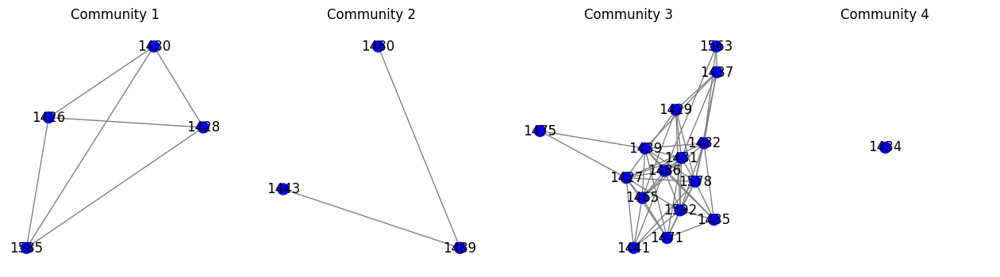

5


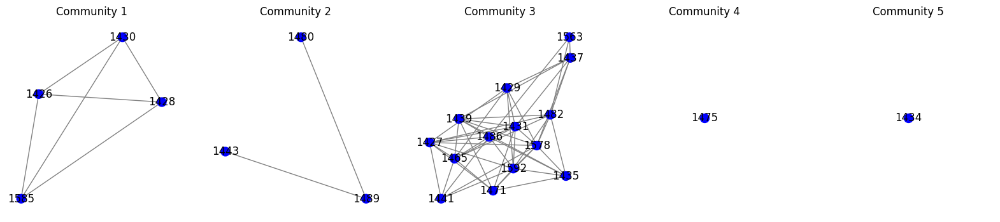

In [34]:

for grade, nodes in group.items():
    tmin = time_to_timestamp(first_break[grade]) + 15*60
    tmax = tmin + 10*60 # 10 minutes
   
    myG = nx.Graph()
    # Filter edges based on nodes and time range
    df_filtered = df[(df['u'].isin(nodes)) & (df['v'].isin(nodes)) & (df['time'] >= tmin) & (df['time'] <= tmax)]

    # Add nodes and edges to the graph
    #myG.add_nodes_from(nodes)
    for _, edge in df_filtered.iterrows():
        myG.add_edge(edge['u'], edge['v'], weight=edge['weight'], time=edge['time'])
    
    communities = list(community.girvan_newman(myG))

    pos, node_colors = assign_colors_to_communities(myG, communities)

    print(f'grade {grade}')
    draw_graph_with_communities(myG, pos, node_colors)

    draw_graph_per_community(myG, pos, node_colors, communities[0])

    draw_graph_per_community(myG, pos, node_colors, communities[1])

    draw_graph_per_community(myG, pos, node_colors, communities[2])

    draw_graph_per_community(myG, pos, node_colors, communities[3])


In [35]:
# h = 

# tmin_dict_here = {x: time_to_timestamp(first_break[x]) + 5*60 for x in group.keys()}
# tmax_dict_here = {x: time_to_timestamp(first_break[x]) + 10*60 for x in group.keys()}

# results = run_temporal_distance_analysis(tmin_dict_here, tmax_dict_here, h)

# for result in results:
#     T_matrix = result['T_matrix']
#     D_matrix = result['D_matrix']

#     finite_T_matrix_mean = [np.mean(row[np.isfinite(row)]) for row in T_matrix]
#     mean_values[result['grade']].append(finite_T_matrix_mean)
#     num_infs[result['grade']].append(np.sum(np.isinf(T_matrix), axis=1))

#     T_matrix[T_matrix == 0] = 1  # Avoid division by zero

#     n = len(T_matrix)
#     print(f'Grade: {result["grade"]}')
#     print(f'Average Temporal Path Duration: {np.sum(T_matrix[np.isfinite(T_matrix)]) / (n*(n-1))}')
#     print(f'Average Temporal Path Hops: {np.sum(D_matrix[np.isfinite(D_matrix)]) / (n*(n-1))}')
#     print(f'Average Temporal Efficiency: {np.sum(1/T_matrix[np.isfinite(T_matrix)]) / (n*(n-1))}')




c:\Users\Dell 5520\Anaconda3\lib\site-packages\ipykernel_launcher.py:89: RuntimeWarning: divide by zero encountered in true_divide


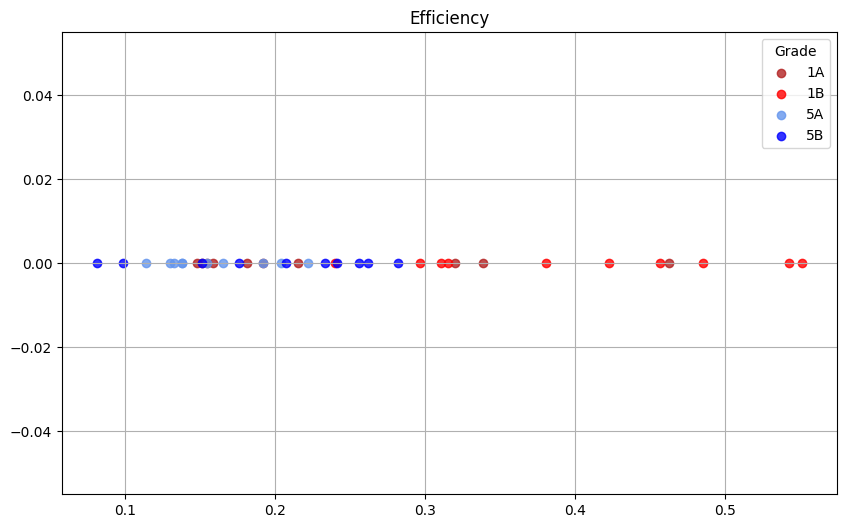

In [36]:
h = 3

efficiency_values = {grade: [] for grade in group.keys()}

for start in range(0, 20, 2):

    tmin_dict_here = {x: time_to_timestamp(first_break[x]) + start*60 for x in group.keys()}
    tmax_dict_here = {x: time_to_timestamp(first_break[x]) + start*60 + 10*60 for x in group.keys()}

    results = run_temporal_distance_analysis(tmin_dict_here, tmax_dict_here, h)

    for result in results:
        T_matrix = result['T_matrix']
        D_matrix = result['D_matrix']

        finite_T_matrix_mean = [np.mean(row[np.isfinite(row)]) for row in T_matrix]
        mean_values[result['grade']].append(finite_T_matrix_mean)
        num_infs[result['grade']].append(np.sum(np.isinf(T_matrix), axis=1))

        T_matrix[T_matrix == 0] = 1  # Avoid division by zero

        n = len(T_matrix)
        # print(f'Grade: {result["grade"]}')
        # print(f'Average Temporal Path Duration: {np.sum(T_matrix[np.isfinite(T_matrix)]) / (n*(n-1))}')
        # print(f'Average Temporal Path Hops: {np.sum(D_matrix[np.isfinite(D_matrix)]) / (n*(n-1))}')
        # print(f'Average Temporal Efficiency: {np.sum(1/T_matrix[np.isfinite(T_matrix)]) / (n*(n-1))}')
        efficiency_values[result['grade']].append(np.sum(1/T_matrix[np.isfinite(T_matrix)]) / (n*(n-1)))
# Create a scatter plot
plt.figure(figsize=(10, 6))

for grade in group.keys():    
    plt.scatter(efficiency_values[grade], np.zeros((1, len(efficiency_values[grade]))), label=grade, color=grade_dict_more[grade], alpha=0.8)

plt.title('Efficiency')
plt.legend(title='Grade')
plt.grid(True)
plt.show()


### Louvian method - lunchbreak

In [37]:
import community as community_louvain


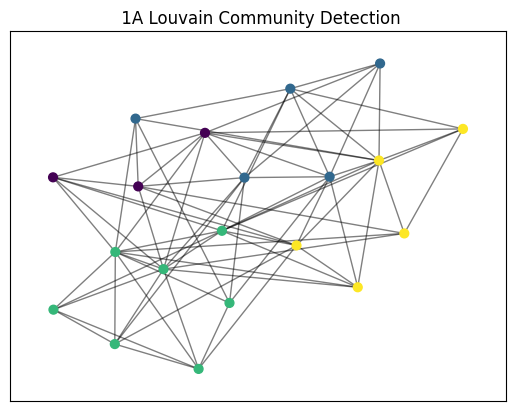

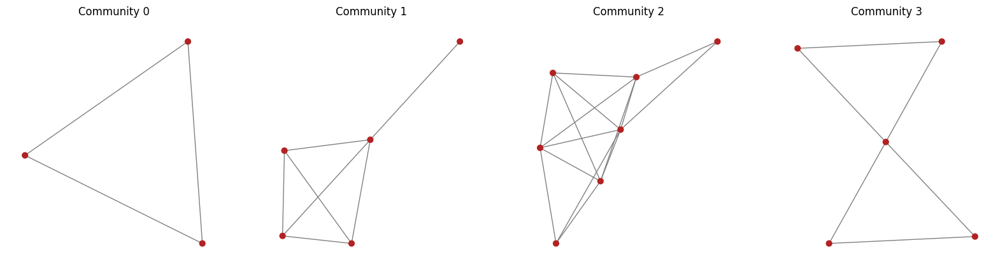

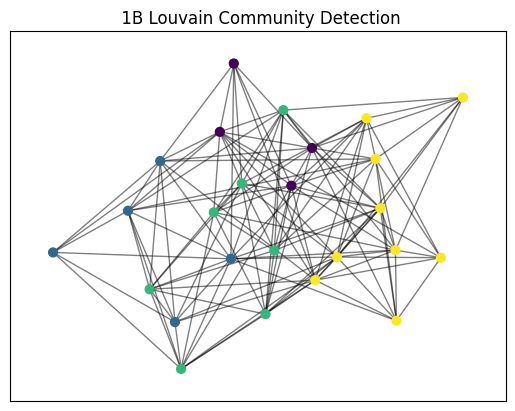

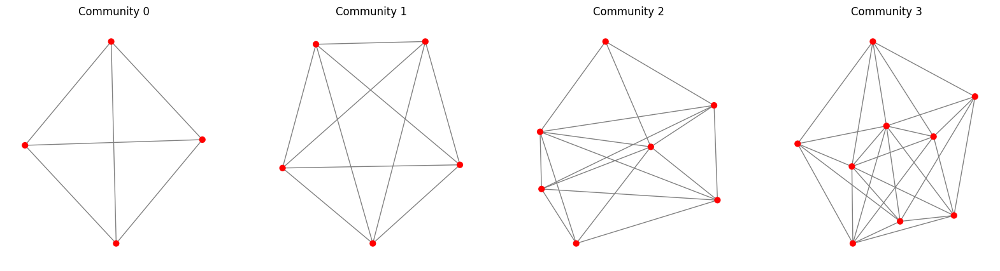

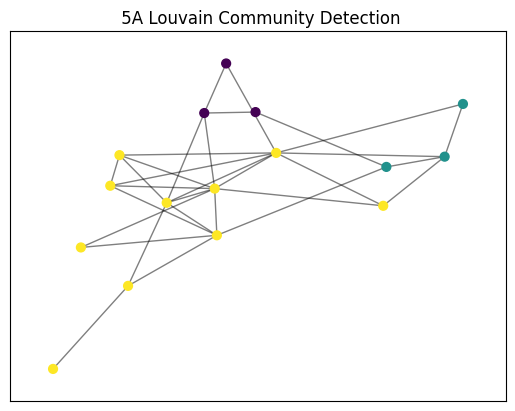

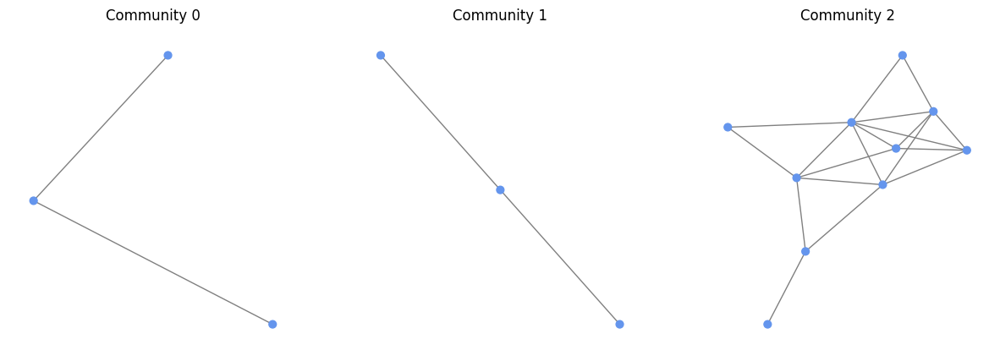

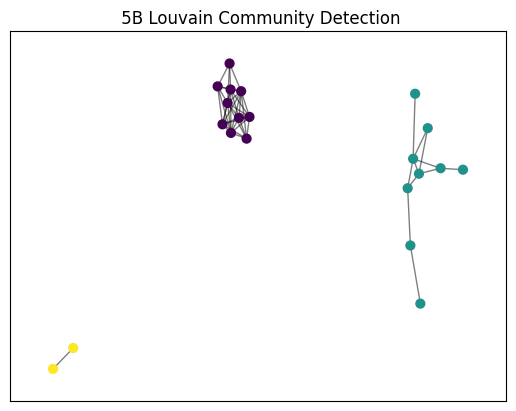

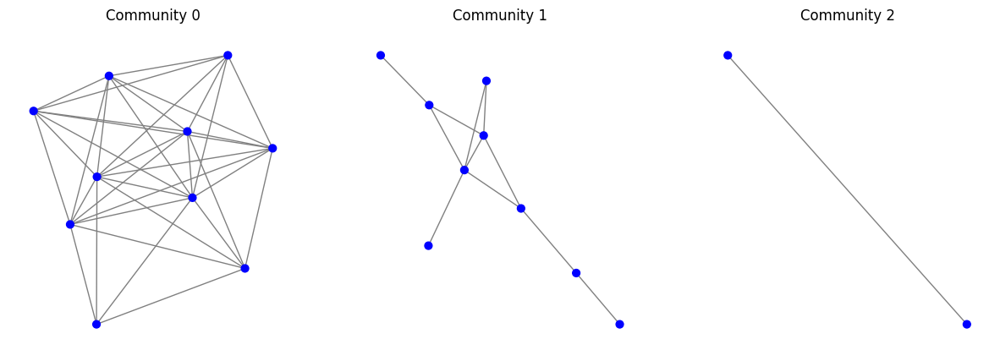

In [38]:
for grade, nodes in group.items():
    tmin = time_to_timestamp(first_break[grade]) +0
    tmax = tmin + 10*60 # 10 minutes
   
    myG = nx.Graph()
    # Filter edges based on nodes and time range
    df_filtered = df[(df['u'].isin(nodes)) & (df['v'].isin(nodes)) & (df['time'] >= tmin) & (df['time'] <= tmax)]

    # Add nodes and edges to the graph
    #myG.add_nodes_from(nodes)
    for _, edge in df_filtered.iterrows():
        myG.add_edge(edge['u'], edge['v'], weight=edge['weight'], time=edge['time'])
    
    partition = community_louvain.best_partition(myG)
        # Draw the graph
    pos = nx.spring_layout(myG)
    cmap = plt.get_cmap('viridis')
    nx.draw_networkx_nodes(myG, pos, partition.keys(), node_size=40, 
                        cmap=cmap, node_color=list(partition.values()))
    nx.draw_networkx_edges(myG, pos, alpha=0.5)
    plt.title(f" {grade} Louvain Community Detection")
    plt.show()

    # Create a dictionary to hold subgraphs
    subgraphs = {}
    for community_id in set(partition.values()):
        subgraphs[community_id] = nx.Graph()

    # Add nodes and edges to the corresponding subgraphs
    for node, community_id in partition.items():
        subgraphs[community_id].add_node(node)
        for neighbor in myG.neighbors(node):
            if partition[neighbor] == community_id:
                subgraphs[community_id].add_edge(node, neighbor)

    # Plot each subgraph in a subplot
    num_communities = len(subgraphs)
    fig, axes = plt.subplots(1, num_communities, figsize=(5*num_communities, 5))
    for ax, (community_id, subgraph) in zip(axes, subgraphs.items()):
        pos = nx.spring_layout(subgraph)
        node_colors = [grade_dict_more[node_grade[node]] for node in subgraph.nodes()]

        nx.draw(subgraph, pos, ax=ax, with_labels=False, node_size=40, node_color = node_colors, edge_color='gray')
        ax.set_title(f"Community {community_id}")

    plt.show()

Actual Lunchtime?

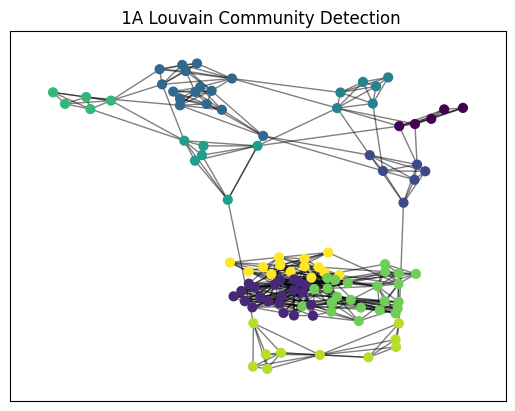

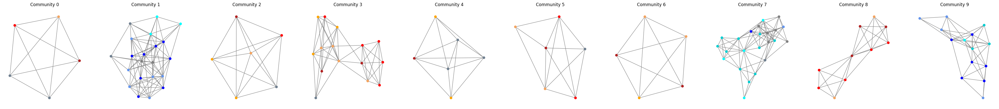

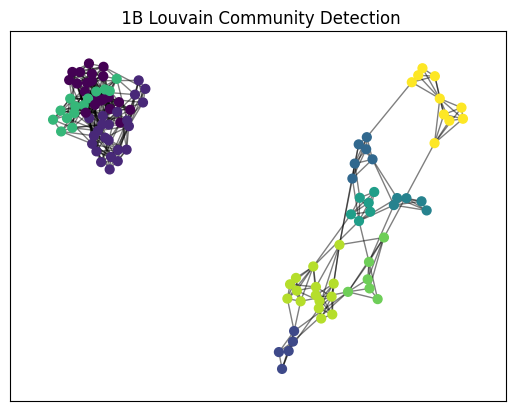

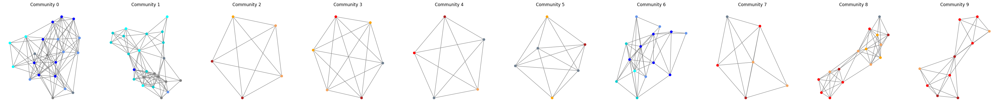

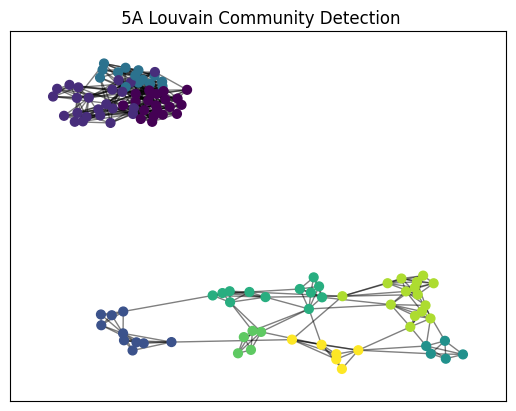

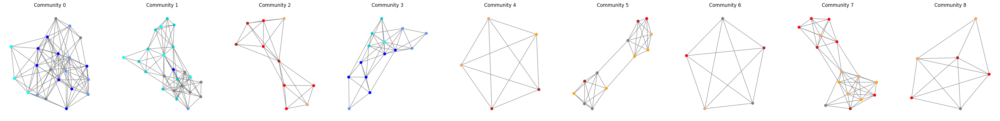

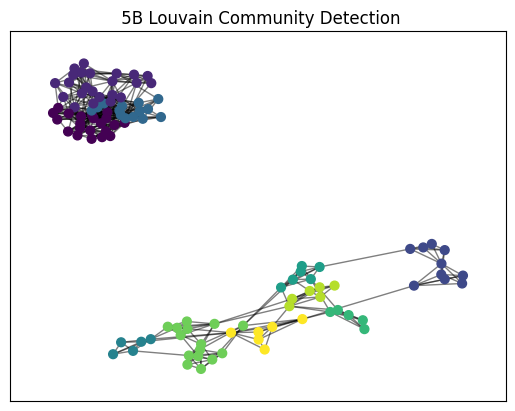

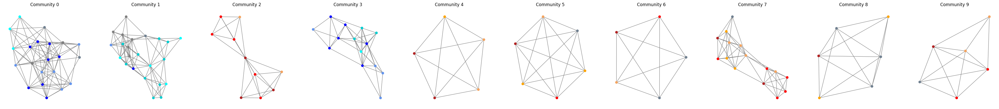

In [39]:
for grade, nodes in group.items():
    tmin = time_to_timestamp("12:00:00") + 20*60
    tmax = tmin + 20*60 # 10 minutes
   
    myG = nx.Graph()
    # Filter edges based on nodes and time range
    df_filtered = df[(df['time'] >= tmin) & (df['time'] <= tmax)]

    # Add nodes and edges to the graph
    #myG.add_nodes_from(nodes)
    for _, edge in df_filtered.iterrows():
        myG.add_edge(edge['u'], edge['v'], weight=edge['weight'], time=edge['time'])
    
    partition = community_louvain.best_partition(myG)

    # Draw the graph
    pos = nx.spring_layout(myG)
    cmap = plt.get_cmap('viridis')
    nx.draw_networkx_nodes(myG, pos, partition.keys(), node_size=40, 
                        cmap=cmap, node_color=list(partition.values()))
    nx.draw_networkx_edges(myG, pos, alpha=0.5)
    plt.title(f" {grade} Louvain Community Detection")
    plt.show()

    # Create a dictionary to hold subgraphs
    subgraphs = {}
    for community_id in set(partition.values()):
        subgraphs[community_id] = nx.Graph()

    # Add nodes and edges to the corresponding subgraphs
    for node, community_id in partition.items():
        subgraphs[community_id].add_node(node)
        for neighbor in myG.neighbors(node):
            if partition[neighbor] == community_id:
                subgraphs[community_id].add_edge(node, neighbor)

    # Plot each subgraph in a subplot
    num_communities = len(subgraphs)
    fig, axes = plt.subplots(1, num_communities, figsize=(5*num_communities, 5))
    for ax, (community_id, subgraph) in zip(axes, subgraphs.items()):
        pos = nx.spring_layout(subgraph)
        node_colors = [grade_dict_more[node_grade[node]] for node in subgraph.nodes()]

        nx.draw(subgraph, pos, ax=ax, with_labels=False, node_size=40, node_color = node_colors, edge_color='gray')
        ax.set_title(f"Community {community_id}")

    plt.show()